# ConstructionSite XAI — Full Pipeline Walkthrough

Prof. Mustafa Abdallah's six-metric XAI evaluation framework (Descriptive Accuracy,
Sparsity, Stability, Efficiency, Robustness, Bounded Completeness) applied to a
Vision-Language Model making construction-site safety judgments.

This notebook runs **the entire pipeline end to end, live**, and visualizes every step.

> ### ▶ How to run this notebook
>
> **Outputs are already saved — you can read it top to bottom without running anything.**
>
> If you do want to run it: use **Run All**, and pick the **`Python (xai-pilot)`** kernel.
> Cells share one Python session and build on each other, so running a cell in the middle
> of a fresh kernel will fail with `NameError` — the names it needs were defined earlier.
> §5 onwards also needs the model loaded, which only happens in §5.1.
>
> A full run takes roughly 5 minutes on an RTX 3070.

### How each section is laid out

Every section follows the same three-beat structure, so you can always tell what a stage
consumes and what it produces:

1. **What goes in / what comes out** — a markdown block stating the stage's inputs,
   the transformation, and its outputs *before* any code runs.
2. **The code** — with a printed input/output preview.
3. **How to read the result** — an interpretation of what just happened.

### What this notebook is

- **No training.** Florence-2-base-ft is loaded pre-trained and run zero-shot — which is
  exactly what the pipeline does. Only the weights are imported.
- **Live GPU execution** on a small subset (16 samples, 4 per class), so every number you
  see below was actually computed by the cell above it.
- **Frozen-pilot configuration**, asserted in §1. Numbers are therefore directly
  comparable to the committed 163-sample results in `pilot/results/*.csv`.

### What this notebook is *not*

> ⚠️ **The subset numbers here are illustrative, not results.** n=16 is far below the
> `MIN_N_FLOOR = 30` samples-per-class reporting floor defined in `xai_pilot/stats.py`.
> Every subset metric below is printed with a *below-floor* banner and shown beside the
> authoritative frozen 163-sample number. Quote the frozen numbers, never these.

This notebook writes **nothing** to `pilot/results/*.csv`.

## 1. Environment and the frozen-config contract

**In:** nothing — this reads the installed environment.
**Out:** confirmation that the interpreter, GPU, library versions, and the five config
flags match the regime the frozen results were produced under.

In [1]:
# --- interpreter guard -------------------------------------------------------
# This notebook MUST run on the pilot venv kernel ("Python (xai-pilot)"). Running it
# on a system Python instead is the one failure mode that does not produce a readable
# error: a mismatched torch/torchvision pair aborts the kernel process outright
# ("The Kernel crashed...") during import, with no traceback in the notebook.
import sys
from pathlib import Path

_exe = Path(sys.executable).resolve()
_in_venv = "pilot" in str(_exe).lower() and ".venv" in str(_exe).lower()
try:
    import xai_pilot
    _has_pkg = True
except ModuleNotFoundError:
    _has_pkg = False

if not (_in_venv and _has_pkg):
    raise RuntimeError(
        "Wrong Python kernel.\n\n"
        f"  running on : {_exe}\n"
        f"  xai_pilot  : {'importable' if _has_pkg else 'NOT INSTALLED'}\n\n"
        "Select the 'Python (xai-pilot)' kernel (kernel picker, top right in VS Code).\n"
        "If it is not listed, register it once:\n"
        "    pilot/.venv/Scripts/python.exe -m ipykernel install --user \\\n"
        "        --name xai-pilot --display-name \"Python (xai-pilot)\"\n\n"
        "Do NOT work around this by appending src/ to sys.path -- that only defers the\n"
        "failure to the point where torch loads, where it crashes the kernel instead."
    )
print(f"interpreter OK: {_exe}")
# -----------------------------------------------------------------------------

import json, warnings, itertools
from collections import Counter

import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap

warnings.filterwarnings("ignore", category=UserWarning)

from xai_pilot import config
from xai_pilot.config import DATA_DIR, RESULTS_DIR, FIGURES_DIR, MODEL_ID, HF_DATASET_ID

print(f"torch        {torch.__version__}   CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU          {torch.cuda.get_device_name(0)}")
import transformers
print(f"transformers {transformers.__version__}   (must be 4.x: >=5.0 breaks Florence-2 remote code)")
print(f"model        {MODEL_ID}")
print(f"dataset      {HF_DATASET_ID}")

interpreter OK: D:\My Projects\Explainable-AI-Mustafa-Abdallah\pilot\.venv\Scripts\python.exe


torch        2.12.1+cu130   CUDA available: True
GPU          NVIDIA GeForce RTX 3070


transformers 4.49.0   (must be 4.x: >=5.0 breaks Florence-2 remote code)
model        microsoft/Florence-2-base-ft
dataset      LouisChen15/ConstructionSite


In [2]:
# Imported locally so this cell also runs standalone (see the note at the top: every
# other cell in this notebook builds on earlier ones and needs Run All).
from xai_pilot import config

FROZEN = {
    "REGION_RANKING": "area",
    "LABELING": "priority",
    "COMPLIANT_ASSIGNMENT": "round_robin",
    "DECODING": "beam",
    "REPORT_WORKER_LOSS_CORRECTED": False,
}
actual = {k: getattr(config, k) for k in FROZEN}
drift = {k: (v, actual[k]) for k, v in FROZEN.items() if actual[k] != v}
assert not drift, f"config drifted from the frozen pilot regime: {drift}"

meanings = {
    "REGION_RANKING": ("which box gets masked first: sort candidate boxes by AREA,",
                       "largest first -> the worker's body outranks the hard hat"),
    "LABELING": ("how many labels a multi-hazard image gets: only ONE, the",
                 "highest-priority violation; the other hazards are discarded"),
    "COMPLIANT_ASSIGNMENT": ("which rule to test a violation-free image against: cycle",
                             "1,2,3,4 in order, ignoring what is actually in the image"),
    "DECODING": ("text-generation strategy (NOT a structural beam): keep the 3",
                 "best partial token sequences alive in parallel, num_beams=3"),
    "REPORT_WORKER_LOSS_CORRECTED": ("report raw flip rates only; do not also report a",
                                     "'genuine' rate that excludes worker-loss artifacts"),
}
print(f"{'flag':<32}{'value':<14}what it controls")
print("-" * 108)
for k, v in actual.items():
    line1, line2 = meanings[k]
    print(f"{k:<32}{str(v):<14}{line1}")
    print(f"{'':<46}{line2}")
print("-" * 108)
print("frozen-pilot regime confirmed -> numbers below are comparable to results/*.csv")
print("\nEach of these is explained in full in section 1.1 below, with the terms")
print("('flip rate', 'worker loss', 'beam search') defined in the 1.2 glossary.")

flag                            value         what it controls
------------------------------------------------------------------------------------------------------------
REGION_RANKING                  area          which box gets masked first: sort candidate boxes by AREA,
                                              largest first -> the worker's body outranks the hard hat
LABELING                        priority      how many labels a multi-hazard image gets: only ONE, the
                                              highest-priority violation; the other hazards are discarded
COMPLIANT_ASSIGNMENT            round_robin   which rule to test a violation-free image against: cycle
                                              1,2,3,4 in order, ignoring what is actually in the image
DECODING                        beam          text-generation strategy (NOT a structural beam): keep the 3
                                              best partial token sequences alive in parallel, num_

### 1.1 What each flag actually means

The one-line table above is a summary. Here is what each flag really controls.

#### First: how do these "flags" work?

They are **plain module-level variables** in `pilot/src/xai_pilot/config.py` — ordinary
Python constants, not functions, not environment variables:

```python
REGION_RANKING = "area"
DECODING = "beam"
```

Two ways the code consumes them:

1. **Read at call time.** `model._effective_num_beams()` looks up `config.DECODING`
   *every call*, so a script can reassign `config.DECODING = "greedy"` and every
   subsequent call picks it up without reimporting.
2. **Passed as a parameter that defaults to the constant**, e.g.
   `select_balanced_sample(..., labeling="priority")`.

There is one small helper function, `config.decoding_num_beams()`, which just maps the
policy name to a number (`"beam" → 3`, `"greedy" → 1`).

Each flag has a default that reproduces the frozen pilot byte-for-byte, and an alternate
value that fixes a known bias. This notebook runs every default — which is why the biases
are visible here rather than hidden.

---

#### `REGION_RANKING = "area"` — "largest model box ranked first (the known PPE-size bias)"

Once Florence-2 returns boxes, the masking metrics need to know **which box to delete
first**. This flag is that ordering rule. `"area"` means: sort by box area, biggest first.

Why that is a bias, concretely. For `rule_1` the model returns two kinds of box:

| box | typical size |
|---|---|
| the worker's whole body | large |
| the hard hat on their head | small |

Sorting by area puts **the worker's body first, essentially always**. So when the pipeline
says "we masked the most important explanation region and the answer changed", the region
it masked was usually *the worker* — not the hard hat the rule is actually about. §8
measures this: 100% of worn-PPE samples in this subset.

The alternate, `"rule_aware"`, promotes the rule's queried object above the body regardless
of size.

---

#### `LABELING = "priority"` — "highest-priority violation only; multi-hazard images collapse"

A single photo can break several rules at once — say a worker with no hard hat (`rule_1`)
standing beside an unguarded excavation edge (`rule_3`). This flag decides how many labels
that photo gets.

`"priority"` keeps **only one**, using this fixed order (`config.CLASS_PRIORITY`):

```
ppe_violation  >  fall_hazard  >  struck_by_risk  >  compliant
```

So the photo above is labelled `ppe_violation`, tested **only** against `rule_1`, and its
guardrail hazard is never evaluated at all. That discarding is what **"collapse"** means:
several true labels squashed down into one, and the rest thrown away.

This hurts the rarest class most — `struck_by_risk` sits lowest in the order, so it loses
its label whenever any other violation is present. The alternate, `"multilabel"`, counts an
image toward *every* class it violates and tests it against every violated rule.

---

#### `COMPLIANT_ASSIGNMENT = "round_robin"` — "compliant images cycle all 4 rules blindly"

A compliant image violates nothing, so there is no natural rule to test it against — but
the pipeline needs one. `"round_robin"` just cycles: rule_1, rule_2, rule_3, rule_4,
rule_1, … in order, **ignoring image content**.

The failure this causes: a compliant image with no excavator anywhere in frame can be
assigned `rule_4` (worker-near-excavator). The model grounds `"excavator"`, finds nothing,
and trivially answers "safe". That is a **vacuous test** — it was never possible to fail,
so it inflates compliant-class accuracy without measuring anything.

`"context_matched"` routes excavator scenes to `rule_4` and never assigns `rule_4` to
excavator-free scenes.

---

#### `DECODING = "beam"` — beam **search**, not a structural beam


Florence-2 produces its output as a sequence of tokens, one at a time. At each step it must
pick the next token, and there are two strategies here:

| strategy | `num_beams` | how it chooses |
|---|---|---|
| **greedy** | 1 | take the single most likely next token, every step. Fast, but one bad early token derails the whole sequence — it can never back out. |
| **beam search** | 3 | keep the **3 best partial sequences alive in parallel**. Extend all of them, score the results, keep the best 3 again, and repeat. At the end, return the best complete sequence. |

Each of those parallel candidate sequences is called a "beam". `num_beams=3` means three
are tracked at once. Beam search generally produces better output because it can recover
from a bad first token; it costs roughly proportionally more compute.

The frozen pilot uses beam search (`num_beams=3`) for baseline, masking, and robustness.
Two stages deliberately differ and pass `num_beams` explicitly, so this flag does not
affect them: **attribution** uses greedy (§10 explains why — beam search reorders the batch
dimension and the attentions no longer line up), and **stability** uses random sampling
(§11 — deterministic decoding would be "100% stable" by construction, proving nothing).

---

#### `REPORT_WORKER_LOSS_CORRECTED = False` — "raw flip rates; worker-loss artifact not discounted"

This one needs two terms defined first — see the glossary immediately below.

### 1.2 Glossary of terms used throughout

**Flip / flip rate.** The core move of Descriptive Accuracy (§9): black out the
top-ranked explanation region, re-run the rule, and see whether the verdict changes —
`compliant → violation`, or `hazard → safe`. A changed verdict is a **flip**. The **flip
rate** is the fraction of samples that flipped.

The logic: if a region genuinely drove the decision, removing it should change the
decision. A high flip rate is evidence the explanations point at load-bearing evidence; a
low one suggests the highlighted region was incidental. The frozen pilot's flip rate is
36.2% over 163 samples.

**Worker-loss artifact.** This is the most important caveat in the project, and it is a
chain of three facts:

1. The proxy needs worker boxes. If **no worker is detected at all**,
   `_presence_verdict` takes a different branch entirely — *"compliant if the safety
   object exists anywhere in the image"* — a **scene-level** check rather than a
   per-worker one.
2. Because `REGION_RANKING="area"` ranks the worker's body first (above), the region the
   pipeline masks is usually **the worker themselves**.
3. So masking often erases the worker → the detector finds no worker → the code silently
   switches to that other branch → the answer may well change.

That answer change gets counted as a **flip**, as though it were evidence the region
explained the safety decision. It is not. It is an artifact of having deleted the worker
and thereby switched which question was being asked. `flip_due_to_worker_loss` flags
exactly this case.

Setting `REPORT_WORKER_LOSS_CORRECTED = True` makes the metric scripts report every
figure **twice**: **raw** (all flips) and **genuine** (excluding worker-loss flips). The
frozen default is `False`, so the numbers in the committed CSVs are raw. This notebook
prints both, side by side, in §9.

**Graded score.** A continuous [0, 1] companion to the boolean verdict: the fraction of
detected workers that have a safety object nearby (for `rule_4`, the fraction *not* near an
excavator). Higher is always safer. It exists because a boolean flip throws away magnitude
— a mask that drops coverage from 1.0 to 0.5 without crossing the verdict threshold scores
zero under the boolean test, but is clearly a real effect. `NaN` when no worker was
detected.

**Grid fallback.** When the model returns **no box at all**, the pipeline falls back to a
4×4 grid of image cells as "candidate regions". These are arbitrary — the model pointed at
nothing — so such samples are tagged `source="grid"` and classified
`no_usable_explanation` in §14 rather than being scored as if a real explanation existed.

In [3]:
# The flags are ordinary module-level variables. Demonstrating that concretely, because
# "flag" can suggest a command-line switch or an environment variable, and these are
# neither -- they are Python constants that functions read when they run.
#
# Imported locally so this explanatory cell can be run on its own without first running
# the whole notebook -- it is the one cell a reader is most likely to click into directly.
import inspect

from xai_pilot import config

print(f"type of config.REGION_RANKING : {type(config.REGION_RANKING).__name__}  "
      f"value = {config.REGION_RANKING!r}")
print(f"type of config.DECODING       : {type(config.DECODING).__name__}  "
      f"value = {config.DECODING!r}")
print(f"\nconfig.decoding_num_beams() is a helper FUNCTION mapping policy -> number:")
print(f"    DECODING={config.DECODING!r}  ->  num_beams = {config.decoding_num_beams()}")
print(f"    the full mapping: {config.DECODING_NUM_BEAMS}")

print(f"\nclass priority order used by the 'priority' labeling policy:")
print(f"    {' > '.join(config.CLASS_PRIORITY)}")
print("    (an image violating several rules keeps only the leftmost matching class)")

print("\nrule -> class mapping:")
for rule, cls in config.RULE_TO_CLASS.items():
    print(f"    {rule:<20} -> {cls}")

print("\nThe value is read AT CALL TIME, not at import -- this is the function that does it:")
print(inspect.getsource(__import__('xai_pilot.model', fromlist=['x'])._effective_num_beams))

type of config.REGION_RANKING : str  value = 'area'
type of config.DECODING       : str  value = 'beam'

config.decoding_num_beams() is a helper FUNCTION mapping policy -> number:
    DECODING='beam'  ->  num_beams = 3
    the full mapping: {'beam': 3, 'greedy': 1}

class priority order used by the 'priority' labeling policy:
    ppe_violation > fall_hazard > struck_by_risk > compliant
    (an image violating several rules keeps only the leftmost matching class)

rule -> class mapping:
    rule_1_violation     -> ppe_violation
    rule_2_violation     -> fall_hazard
    rule_3_violation     -> fall_hazard
    rule_4_violation     -> struck_by_risk

The value is read AT CALL TIME, not at import -- this is the function that does it:


def _effective_num_beams(num_beams: int | None) -> int:
    """Resolve the beam count for a run_task call (Phase 1.6).

    An explicit value always wins (stability and attribution pass num_beams
    directly). ``None`` resolves from the global config.DECODING policy, so a
    single switch unifies baseline/masking/robustness/sparsity onto one path.
    Read at call time so a script can flip config.DECODING before running.
    """
    return num_beams if num_beams is not None else config.decoding_num_beams()



### 1.3 Plot styling and shared helpers

In [4]:
# Categorical slots 1-4 of a CVD-validated palette (worst adjacent pair: CVD dE 9.1,
# normal-vision dE 22.9 -- both clear of the floors). Two of the four sit below 3:1
# contrast on a light surface, so every bar also carries a direct value label; identity
# and magnitude are never left to colour alone.
CLASS_COLORS = {
    "compliant":      "#2a78d6",  # blue
    "ppe_violation":  "#eb6834",  # orange
    "fall_hazard":    "#1baf7a",  # aqua
    "struck_by_risk": "#eda100",  # yellow
}
CLASS_ORDER = ["compliant", "ppe_violation", "fall_hazard", "struck_by_risk"]
ACCENT, ACCENT_2, ACCENT_3 = "#2a78d6", "#eb6834", "#1baf7a"
INK, SECONDARY, MUTED, GRID, BASELINE = "#0b0b0b", "#52514e", "#898781", "#e1e0d9", "#c3c2b7"
GT_COLOR, PRED_COLOR = "#d03b3b", "#2a78d6"   # ground truth vs model prediction
SEQ = LinearSegmentedColormap.from_list(
    "seq_blue", ["#cde2fb", "#9ec5f4", "#6da7ec", "#3987e5", "#2a78d6", "#1c5cab", "#0d366b"]
)

# One type scale for every figure in the notebook. Previously 8 different ad-hoc
# fontsize values were scattered across 53 call sites; collapsing them to a few named
# steps is what makes figure text consistent from section to section. Body text sits at
# FS_BODY and every other size is a deliberate step away from it.
FS_SUPTITLE = 12   # figure-level suptitle
FS_TITLE    = 11   # axes title
FS_LABEL    = 10   # axis labels; also the matplotlib default size
FS_BODY     = 9    # annotations, legends, value labels, ordinary tick labels
FS_SMALL    = 8    # secondary captions, image-panel titles
FS_DENSE    = 7    # 16-item rotated tick labels, where anything larger collides

plt.rcParams.update({
    "figure.facecolor": "white", "axes.facecolor": "white",
    "font.size": FS_LABEL, "axes.titlesize": FS_TITLE, "axes.titleweight": "bold",
    "axes.labelsize": FS_LABEL, "xtick.labelsize": FS_BODY, "ytick.labelsize": FS_BODY,
    "legend.fontsize": FS_BODY, "figure.titlesize": FS_SUPTITLE,
    "axes.labelcolor": SECONDARY, "text.color": INK,
    "xtick.color": MUTED, "ytick.color": MUTED,
    "axes.edgecolor": BASELINE, "figure.dpi": 110,
})

def style_ax(ax, ygrid=True):
    for s in ("top", "right"):
        ax.spines[s].set_visible(False)
    if ygrid:
        ax.yaxis.grid(True, color=GRID, linewidth=0.8)
        ax.set_axisbelow(True)
    return ax

def label_bars(ax, bars, fmt="{:.0%}", dy=0.01):
    for b in bars:
        h = b.get_height()
        if h == h:
            ax.text(b.get_x() + b.get_width() / 2, h + dy, fmt.format(h),
                    ha="center", va="bottom", fontsize=FS_BODY, color=SECONDARY)

def show_images(images, titles, figsize_each=(3.6, 3.0), suptitle=None, title_colors=None):
    n = len(images)
    fig, axes = plt.subplots(1, n, figsize=(figsize_each[0] * n, figsize_each[1]))
    axes = np.atleast_1d(axes)
    for i, (ax, im, t) in enumerate(zip(axes, images, titles)):
        ax.imshow(im); ax.axis("off")
        ax.set_title(t, fontsize=FS_BODY, color=(title_colors[i] if title_colors else INK))
    if suptitle:
        fig.suptitle(suptitle, fontsize=FS_TITLE, fontweight="bold", y=1.02)
    fig.tight_layout(); plt.show()

def stage(title, inputs, outputs):
    # Makes each pipeline stage's contract explicit at the point it runs.
    width = 78
    print("+" + "-" * width)
    print(f"| STAGE : {title}")
    print(f"| IN    : {inputs}")
    print(f"| OUT   : {outputs}")
    print("+" + "-" * width)

def below_floor_banner(n, what):
    from xai_pilot.stats import meets_min_n, MIN_N_FLOOR
    ok = meets_min_n(n)
    print(f"[{'OK' if ok else 'BELOW FLOOR'}] {what}: n={n} vs MIN_N_FLOOR={MIN_N_FLOOR} "
          f"-> {'reportable' if ok else 'ILLUSTRATIVE ONLY, do not quote'}")

def denorm(box, size):
    # The dataset stores annotation boxes normalized to [0,1]; everything else in the
    # pipeline works in absolute pixels, so this conversion is needed before drawing.
    w, h = size
    x0, y0, x1, y1 = box
    return (x0 * w, y0 * h, x1 * w, y1 * h)

RULE_FIELDS_ALL = ["rule_1_violation", "rule_2_violation", "rule_3_violation", "rule_4_violation"]

def gt_violations(row, size):
    # Ground-truth violations for one dataset row: rule -> (pixel boxes, human reason).
    out = {}
    for f in RULE_FIELDS_ALL:
        v = row.get(f)
        if isinstance(v, dict):
            out[f.replace("_violation", "")] = (
                [denorm(b, size) for b in v.get("bounding_box", [])],
                v.get("reason", ""),
            )
    return out

print("styling and helpers ready")

styling and helpers ready


## 2. The dataset

`LouisChen15/ConstructionSite` — construction-site photographs annotated with four binary
safety-rule violations plus scene metadata.

### 2.1 What one row actually contains

**In:** the streamed `test` split.
**Out:** three complete example rows, shown as *both* a metadata table *and* the rendered
images with every annotation drawn on them.

The critical fields are easy to miss in a table, so they are called out here:

- `rule_N_violation` is **not a boolean**. It is either `None`, or a dict carrying
  `bounding_box` (a list of normalized `[x0,y0,x1,y1]` boxes) **and `reason`** — a
  human-written sentence explaining the violation. That `reason` is the ground truth we
  compare the model's conclusion against throughout this notebook.
- `excavator`, `rebar`, `worker_with_white_hard_hat` are lists of normalized boxes
  (object annotations, independent of the rule violations).
- All boxes are **normalized to [0,1]** and must be scaled by image size before drawing.

In [5]:
from xai_pilot.data import load_construction_site, classify_image, image_classes, RULE_FIELDS
from xai_pilot.viz import overlay_boxes

stage("2.1 inspect raw schema",
      "streamed test split",
      "3 example rows: metadata table + annotated images")

demo_rows = list(itertools.islice(load_construction_site(split="test", streaming=True), 3))

print("Fields present on every row:")
print("  " + ", ".join(sorted(demo_rows[0].keys())))
print()

# SAMPLE OUTPUT: the exact structure of one violation field, printed verbatim.
for r in demo_rows:
    viols = {f: r[f] for f in RULE_FIELDS_ALL if isinstance(r[f], dict)}
    print(f"image_id {r['image_id']}  size {r['image'].size}  class -> {classify_image(r)[0]}")
    if viols:
        for f, v in viols.items():
            print(f"    {f}: bounding_box={v['bounding_box']}")
            print(f"        reason: {v['reason']}")
    else:
        print("    (no rule violations -> compliant)")
    objs = {k: r[k] for k in ('excavator', 'rebar', 'worker_with_white_hard_hat') if r[k]}
    print(f"    object annotations: {objs if objs else '(none)'}")
    print()

+------------------------------------------------------------------------------
| STAGE : 2.1 inspect raw schema
| IN    : streamed test split
| OUT   : 3 example rows: metadata table + annotated images
+------------------------------------------------------------------------------


Fields present on every row:
  camera_distance, excavator, illumination, image, image_caption, image_id, quality_of_info, rebar, rule_1_violation, rule_2_violation, rule_3_violation, rule_4_violation, view, worker_with_white_hard_hat

image_id 0000001  size (1200, 675)  class -> compliant
    (no rule violations -> compliant)
    object annotations: {'rebar': [[0.82, 0.43, 1.0, 0.64]]}

image_id 0000002  size (900, 1200)  class -> compliant
    (no rule violations -> compliant)
    object annotations: {'excavator': [[0.67, 0.55, 0.78, 0.6], [0.73, 0.49, 0.83, 0.6]]}

image_id 0000005  size (1200, 900)  class -> ppe_violation
    rule_1_violation: bounding_box=[[0.14, 0.59, 0.19, 0.7]]
        reason: Person on the left not using PPE.
    object annotations: {'excavator': [[0.23, 0.29, 0.82, 0.83]]}



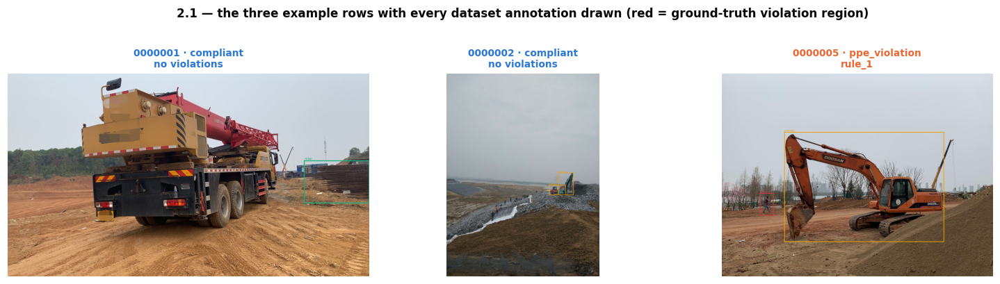

0000005 · rule_1: Person on the left not using PPE.


In [6]:
# Draw every annotation the dataset provides, so the table above becomes visible.
panels, titles, colors = [], [], []
for r in demo_rows:
    img, size = r["image"].convert("RGB"), r["image"].size
    canvas = img
    # Object annotations first (neutral), then violations on top (red) so they dominate.
    for key, col in [("excavator", "#eda100"), ("rebar", "#1baf7a"),
                     ("worker_with_white_hard_hat", "#2a78d6")]:
        boxes = [denorm(b, size) for b in r.get(key, [])]
        if boxes:
            canvas = overlay_boxes(canvas, boxes, [key] * len(boxes), color=col)
    gts = gt_violations(r, size)
    for rule, (boxes, reason) in gts.items():
        if boxes:
            canvas = overlay_boxes(canvas, boxes, [f"GT {rule}"] * len(boxes), color=GT_COLOR)
    cls = classify_image(r)[0]
    panels.append(canvas)
    titles.append(f"{r['image_id']} · {cls}\n" +
                  (" | ".join(gts) if gts else "no violations"))
    colors.append(CLASS_COLORS[cls])

show_images(panels, titles, figsize_each=(4.6, 3.6), title_colors=colors,
            suptitle="2.1 — the three example rows with every dataset annotation drawn "
                     "(red = ground-truth violation region)")

for r in demo_rows:
    for rule, (_, reason) in gt_violations(r, r["image"].size).items():
        print(f"{r['image_id']} · {rule}: {reason}")

**How to read this.** The red boxes are the dataset's own ground-truth violation regions,
with the reason printed beneath. Everything else is object annotation. Note that a single
image can carry more than one `rule_N_violation` — the third example does — which is
exactly the multi-hazard case the frozen `LABELING="priority"` policy collapses to one
label. That collapse is measured in §2.2.

### 2.2 Distribution across the split

**In:** a bounded scan of the first 2000 test rows (seconds, not minutes).
**Out:** class balance, rule co-occurrence, and the multi-hazard rate.

In [7]:
stage("2.2 scan split statistics",
      "first 2000 test rows",
      "class counts, 4x4 rule co-occurrence matrix, violations-per-image histogram")

SCAN_N = 2000
rows_meta, class_counter = [], Counter()
cooc = np.zeros((4, 4), dtype=int)

for i, row in enumerate(load_construction_site(split="test", streaming=True)):
    if i >= SCAN_N:
        break
    violated = [f for f in RULE_FIELDS if row.get(f) is not None]
    primary, _ = classify_image(row)
    class_counter[primary] += 1
    idxs = [RULE_FIELDS.index(f) for f in violated]
    for a in idxs:
        for b in idxs:
            cooc[a, b] += 1
    rows_meta.append({"image_id": row["image_id"], "primary_class": primary,
                      "n_violations": len(violated),
                      "quality_of_info": row["quality_of_info"],
                      "illumination": row["illumination"],
                      "camera_distance": row["camera_distance"], "view": row["view"]})

meta_df = pd.DataFrame(rows_meta)
print(f"scanned {len(meta_df)} rows")
print("\nSAMPLE OUTPUT (first 5 rows of the derived table):")
print(meta_df.head().to_string(index=False))

+------------------------------------------------------------------------------
| STAGE : 2.2 scan split statistics
| IN    : first 2000 test rows
| OUT   : class counts, 4x4 rule co-occurrence matrix, violations-per-image histogram
+------------------------------------------------------------------------------


scanned 2000 rows

SAMPLE OUTPUT (first 5 rows of the derived table):
image_id primary_class  n_violations quality_of_info    illumination camera_distance           view
 0000001     compliant             0       poor info normal lighting  short distance elevation view
 0000002     compliant             0       rich info    underexposed   long distance elevation view
 0000005 ppe_violation             1       rich info normal lighting    mid distance elevation view
 0000007 ppe_violation             2       poor info           night  short distance elevation view
 0000009 ppe_violation             2       poor info normal lighting    mid distance elevation view


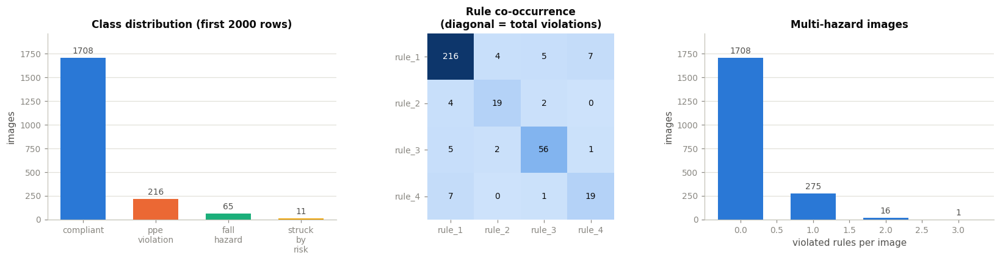

INTERPRETATION: 0.9% of scanned images violate more than one rule.
Under frozen LABELING='priority' each of those is collapsed to a single class and
tested against a single rule, so the other hazards present in the image are never
evaluated. That is the information the scale-up's 'multilabel' mode recovers.


In [8]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

ax = style_ax(axes[0])
counts = [class_counter.get(c, 0) for c in CLASS_ORDER]
bars = ax.bar(range(4), counts, color=[CLASS_COLORS[c] for c in CLASS_ORDER], width=0.62)
label_bars(ax, bars, fmt="{:.0f}", dy=max(counts) * 0.015)
ax.set_xticks(range(4)); ax.set_xticklabels([c.replace("_", "\n") for c in CLASS_ORDER], fontsize=FS_BODY)
ax.set_ylabel("images"); ax.set_title(f"Class distribution (first {SCAN_N} rows)")
ax.set_ylim(0, max(counts) * 1.15)

ax = axes[1]
short = [f.replace("_violation", "") for f in RULE_FIELDS]
ax.imshow(cooc, cmap=SEQ)
ax.set_xticks(range(4)); ax.set_xticklabels(short, fontsize=FS_BODY)
ax.set_yticks(range(4)); ax.set_yticklabels(short, fontsize=FS_BODY)
for a in range(4):
    for b in range(4):
        ax.text(b, a, cooc[a, b], ha="center", va="center", fontsize=FS_BODY,
                color="white" if cooc[a, b] > cooc.max() * 0.55 else INK)
ax.set_title("Rule co-occurrence\n(diagonal = total violations)")
for s in ax.spines.values():
    s.set_visible(False)

ax = style_ax(axes[2])
nv = meta_df["n_violations"].value_counts().sort_index()
bars = ax.bar(nv.index, nv.values, color=ACCENT, width=0.62)
label_bars(ax, bars, fmt="{:.0f}", dy=nv.max() * 0.015)
ax.set_xlabel("violated rules per image"); ax.set_ylabel("images")
ax.set_title("Multi-hazard images"); ax.set_ylim(0, nv.max() * 1.15)

fig.tight_layout(); plt.show()

multi = (meta_df["n_violations"] > 1).mean()
print(f"INTERPRETATION: {multi:.1%} of scanned images violate more than one rule.")
print("Under frozen LABELING='priority' each of those is collapsed to a single class and")
print("tested against a single rule, so the other hazards present in the image are never")
print("evaluated. That is the information the scale-up's 'multilabel' mode recovers.")

## 3. The four safety rules and the four classes

Before any sampling, this is the vocabulary the rest of the notebook uses.

### The rules

| rule | hazard type | what must be present | grounded phrase | proximity threshold |
|---|---|---|---|---|
| `rule_1` | PPE violation | a hard hat, per worker | `"hard hat"` | 0.08 × max(W,H) |
| `rule_2` | fall hazard | a safety harness, per worker | `"safety harness"` | 0.08 × max(W,H) |
| `rule_3` | fall hazard | a guardrail protecting the worker | `"guardrail"` | 0.20 × max(W,H) |
| `rule_4` | struck-by risk | worker **away from** an excavator | `"worker"` + `"excavator"` | 0.05 × max(W,H) |

`rule_3`'s threshold is deliberately looser: a guardrail is structural and protects from a
distance, whereas worn PPE must be tight to the body. `rule_4` inverts the logic — it is
the only rule where *proximity means danger* rather than safety.

### The classes

An image's class is derived from which rules it violates, using the frozen `priority`
policy — the highest-priority violation wins and the rest are discarded:

| class | derived from | priority |
|---|---|---|
| `ppe_violation` | `rule_1` | highest |
| `fall_hazard` | `rule_2` or `rule_3` | ↓ |
| `struck_by_risk` | `rule_4` | lowest |
| `compliant` | no violations | — |

A compliant image has no rule to test, so the frozen `round_robin` policy assigns it one
by cycling through all four — blindly. That is why a compliant image can end up tested
against `rule_4` with no excavator anywhere in frame.

**In:** the scanned metadata plus fresh images.
**Out:** one worked example of each class, with its ground-truth violation region and the
dataset's own written reason.

+------------------------------------------------------------------------------
| STAGE : 3 illustrate each class
| IN    : streamed test split
| OUT   : one example image per class, annotated with GT region + reason
+------------------------------------------------------------------------------


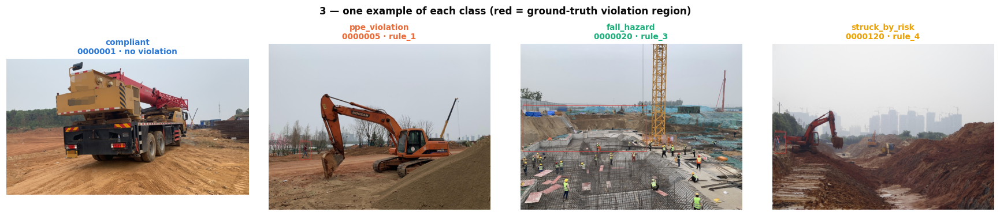

The dataset's own stated reason for each violation:

compliant        0000001: (compliant -- nothing to explain)
ppe_violation    0000005 · rule_1: Person on the left not using PPE.
fall_hazard      0000020 · rule_3: Embankment on the left does not use edge protection.
struck_by_risk   0000120 · rule_4: The two workers on the left are very close to the red excavator in operation.


In [9]:
stage("3 illustrate each class",
      "streamed test split",
      "one example image per class, annotated with GT region + reason")

# Find one clean example of each class.
want = {c: None for c in CLASS_ORDER}
for row in load_construction_site(split="test", streaming=True):
    cls, _ = classify_image(row)
    if cls in want and want[cls] is None:
        want[cls] = row
    if all(v is not None for v in want.values()):
        break

panels, titles, colors, reasons = [], [], [], []
for cls in CLASS_ORDER:
    row = want[cls]
    img, size = row["image"].convert("RGB"), row["image"].size
    gts = gt_violations(row, size)
    canvas = img
    for rule, (boxes, reason) in gts.items():
        if boxes:
            canvas = overlay_boxes(canvas, boxes, [f"GT {rule}"] * len(boxes), color=GT_COLOR)
    panels.append(canvas)
    titles.append(f"{cls}\n{row['image_id']} · " + ("+".join(gts) if gts else "no violation"))
    colors.append(CLASS_COLORS[cls])
    reasons.append((cls, row["image_id"], gts))

show_images(panels, titles, figsize_each=(4.0, 3.3), title_colors=colors,
            suptitle="3 — one example of each class (red = ground-truth violation region)")

print("The dataset's own stated reason for each violation:\n")
for cls, iid, gts in reasons:
    if not gts:
        print(f"{cls:<16} {iid}: (compliant -- nothing to explain)")
    for rule, (_, reason) in gts.items():
        print(f"{cls:<16} {iid} · {rule}: {reason}")

**How to read this.** These `reason` strings are the human ground truth. Keep them in
mind: the model never sees them, and never produces anything comparable. It outputs boxes
and a geometric verdict. Section 5 makes the size of that gap explicit.

## 4. Sample selection

**In:** the streamed `test` split, a seed, and a per-class quota.
**Out:** a balanced manifest of 16 samples (4 per class), each tagged with the single rule
it will be tested against, plus the cached pixels for every one.

`select_balanced_sample` makes one streaming pass, fills a bounded per-class reservoir,
then draws a seeded shuffle from each — so source prevalence cannot dominate the
evaluation set. The frozen pilot drew 50 per class where the data allowed, yielding 163.

In [10]:
from xai_pilot.data import select_balanced_sample

N_PER_CLASS, SEED = 4, 42
stage("4 select balanced sample",
      f"test split, n_per_class={N_PER_CLASS}, seed={SEED}",
      "16 Sample records (image_id, primary_class, assigned_rule_id, violated_rule_ids)")

samples = select_balanced_sample(load_construction_site(split="test", streaming=True),
                                 n_per_class=N_PER_CLASS, seed=SEED)

sample_df = pd.DataFrame([{
    "image_id": s.image_id, "primary_class": s.primary_class,
    "assigned_rule_id": s.assigned_rule_id,
    "violated_rules": "|".join(r.replace("_violation", "") for r in s.violated_rule_ids) or "-",
} for s in samples])
print("SAMPLE OUTPUT (the full manifest):")
print(sample_df.to_string(index=False))

+------------------------------------------------------------------------------
| STAGE : 4 select balanced sample
| IN    : test split, n_per_class=4, seed=42
| OUT   : 16 Sample records (image_id, primary_class, assigned_rule_id, violated_rule_ids)
+------------------------------------------------------------------------------


SAMPLE OUTPUT (the full manifest):
image_id  primary_class assigned_rule_id violated_rules
 0000095  ppe_violation           rule_1  rule_1|rule_3
 0000019  ppe_violation           rule_1         rule_1
 0000102  ppe_violation           rule_1         rule_1
 0000599  ppe_violation           rule_1         rule_1
 0000468    fall_hazard           rule_3         rule_3
 0000478    fall_hazard           rule_3         rule_3
 0000443    fall_hazard           rule_3         rule_3
 0000020    fall_hazard           rule_3         rule_3
 0000120 struck_by_risk           rule_4         rule_4
 0003088 struck_by_risk           rule_4         rule_4
 0004196 struck_by_risk           rule_4         rule_4
 0000327 struck_by_risk           rule_4         rule_4
 0000045      compliant           rule_1              -
 0000057      compliant           rule_2              -
 0000060      compliant           rule_3              -
 0000023      compliant           rule_4              -


In [11]:
# Fetch the pixels and the ground-truth annotations once; every later section reuses this.
target_ids = {s.image_id for s in samples}
IMAGES, GT = {}, {}
for row in load_construction_site(split="test", streaming=True):
    if row["image_id"] in target_ids:
        img = row["image"].convert("RGB")
        IMAGES[row["image_id"]] = img
        GT[row["image_id"]] = gt_violations(row, img.size)
    if len(IMAGES) >= len(target_ids):
        break
print(f"cached {len(IMAGES)} images + ground-truth annotations")
print(f"image sizes present: {sorted({im.size for im in IMAGES.values()})}")

frozen_manifest = pd.read_csv(DATA_DIR / "pilot_samples.csv", dtype=str)
overlap = target_ids & set(frozen_manifest["image_id"])
print(f"\nfrozen pilot manifest: {len(frozen_manifest)} samples; overlap with this draw: "
      f"{len(overlap)}/{len(target_ids)}")
print("INTERPRETATION: the reservoir is seeded, but changing n_per_class changes which")
print("prefix is kept, so this is a fresh sample rather than a subset of the frozen one.")

cached 16 images + ground-truth annotations
image sizes present: [(540, 720), (673, 1200), (900, 1200), (907, 765), (960, 720), (1200, 675), (1200, 900)]

frozen pilot manifest: 163 samples; overlap with this draw: 9/16
INTERPRETATION: the reservoir is seeded, but changing n_per_class changes which
prefix is kept, so this is a fresh sample rather than a subset of the frozen one.


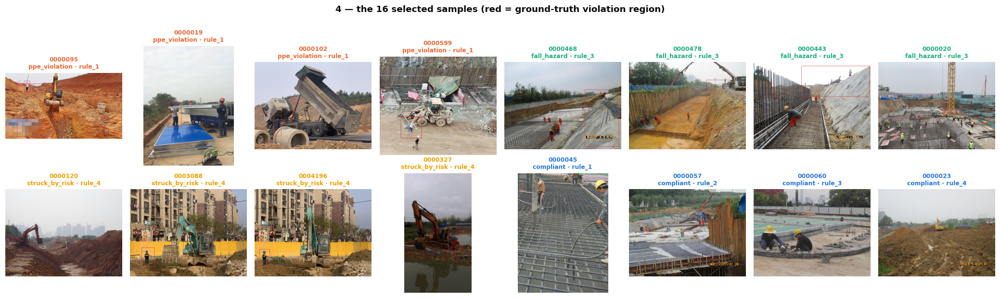

In [12]:
fig, axes = plt.subplots(2, 8, figsize=(19, 5.6))
for ax, s in zip(axes.ravel(), samples):
    canvas = IMAGES[s.image_id]
    for rule, (boxes, _) in GT[s.image_id].items():
        if boxes:
            canvas = overlay_boxes(canvas, boxes, [""] * len(boxes), color=GT_COLOR)
    ax.imshow(canvas); ax.axis("off")
    ax.set_title(f"{s.image_id}\n{s.primary_class} · {s.assigned_rule_id}",
                 fontsize=FS_SMALL, color=CLASS_COLORS[s.primary_class])
fig.suptitle("4 — the 16 selected samples (red = ground-truth violation region)",
             fontsize=FS_SUPTITLE, fontweight="bold", y=1.0)
fig.tight_layout(); plt.show()

## 5. How Florence-2 actually reaches a verdict — and what it never checks

**This section answers the question the whole evaluation depends on: when the pipeline
says "compliant", what has actually been verified?**

Florence-2-base-ft has no free-form VQA task token — you cannot ask it *"is this worker
wearing a hard hat?"*. What it has is open-vocabulary detection: ground a noun phrase, get
boxes back. So each rule is answered by a **geometric proxy**, in three steps.

### 5.1 The two grounding calls

**In:** one image, one rule id.
**Out:** two independent sets of boxes — workers, and the rule's safety object.

Exactly two model calls are made. Each is an `<OPEN_VOCABULARY_DETECTION>` request with a
noun phrase. Nothing else is asked of the model — no question, no reasoning, no text
answer.

In [13]:
from xai_pilot.model import load_florence2
from xai_pilot.prompts import (RULE_QUERIES, RULE_OBJECT_LABEL, RULE_4_PROXIMITY_PAIR,
                               PERSON_PHRASE, rule_object_labels)
from xai_pilot.inference import (answer_rule, _detect, DETECTION_TASK,
                                 PRESENCE_PROXIMITY_FRACTION, PROXIMITY_FRACTION)

model, processor = load_florence2()
print(f"Florence-2 loaded on {next(model.parameters()).device}, "
      f"{sum(p.numel() for p in model.parameters()) / 1e6:.0f}M params (pre-trained, no training)")

print(f"\ntask token used for every call: {DETECTION_TASK}")
print(f"person phrase                 : {PERSON_PHRASE!r}\n")
print(f"{'rule':<9}{'grounded phrase':<26}{'threshold':<24}answers")
print("-" * 88)
for r in ["rule_1", "rule_2", "rule_3"]:
    print(f"{r:<9}{RULE_QUERIES[r][0]!r:<26}"
          f"{str(PRESENCE_PROXIMITY_FRACTION[r]) + ' x max(W,H)':<24}violation / compliant")
print(f"{'rule_4':<9}{str(RULE_4_PROXIMITY_PAIR):<26}"
      f"{str(PROXIMITY_FRACTION) + ' x max(W,H)':<24}hazard / safe")
print("-" * 88)

Florence-2 loaded on cuda:0, 231M params (pre-trained, no training)

task token used for every call: <OPEN_VOCABULARY_DETECTION>
person phrase                 : 'worker'

rule     grounded phrase           threshold               answers
----------------------------------------------------------------------------------------
rule_1   'hard hat'                0.08 x max(W,H)         violation / compliant
rule_2   'safety harness'          0.08 x max(W,H)         violation / compliant
rule_3   'guardrail'               0.2 x max(W,H)          violation / compliant
rule_4   ('worker', 'excavator')   0.05 x max(W,H)         hazard / safe
----------------------------------------------------------------------------------------


### 5.2 The proximity test, visualized

**In:** worker boxes and object boxes in absolute pixels.
**Out:** a verdict, plus a graded score in [0,1].

The rule is:

> A worker is **covered** if some safety-object box either overlaps their box (IoU > 0)
> **or** lies within `threshold` pixels of it, measured edge-to-edge.
> The image is **compliant** only if *every* detected worker is covered.

The threshold is a fraction of the image's longest side. The diagram below draws that
tolerance to scale on a real sample, so the size of the "close enough" region is visible
rather than abstract.

+------------------------------------------------------------------------------
| STAGE : 5.2 proximity geometry
| IN    : worker boxes, object boxes, threshold fraction
| OUT   : per-worker covered/uncovered decision + graded score
+------------------------------------------------------------------------------


image 0000095  size (1200, 675)
SAMPLE INPUT  worker boxes : [(205, 88, 247, 202)]
SAMPLE INPUT  object boxes : [(219, 88, 242, 115)]
threshold: 0.08 x 1200 = 96px


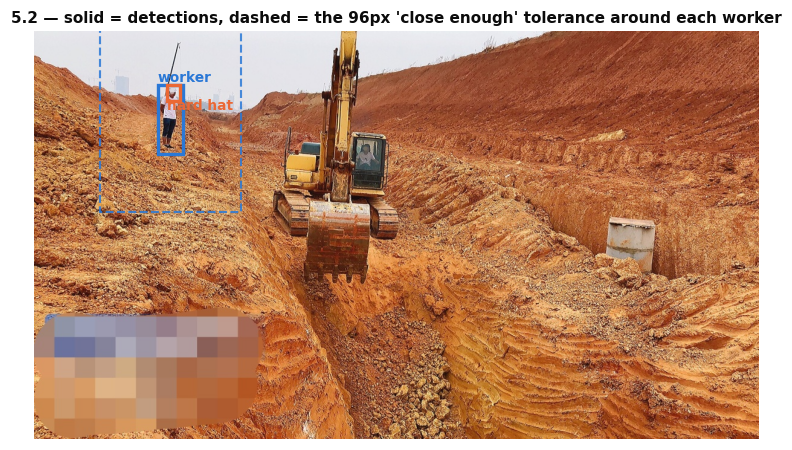

worker 0: covered by object box(es) [0]


In [14]:
stage("5.2 proximity geometry",
      "worker boxes, object boxes, threshold fraction",
      "per-worker covered/uncovered decision + graded score")

demo = next(s for s in samples if s.primary_class == "ppe_violation")
demo_img, demo_rule = IMAGES[demo.image_id], demo.assigned_rule_id
obj_phrase = RULE_QUERIES[demo_rule][0]
w_boxes, _ = _detect(model, processor, demo_img, PERSON_PHRASE)
o_boxes, _ = _detect(model, processor, demo_img, obj_phrase)
thr_px = PRESENCE_PROXIMITY_FRACTION[demo_rule] * max(demo_img.size)

print(f"image {demo.image_id}  size {demo_img.size}")
print(f"SAMPLE INPUT  worker boxes : {[tuple(round(v) for v in b) for b in w_boxes]}")
print(f"SAMPLE INPUT  object boxes : {[tuple(round(v) for v in b) for b in o_boxes]}")
print(f"threshold: {PRESENCE_PROXIMITY_FRACTION[demo_rule]} x {max(demo_img.size)} = {thr_px:.0f}px")

fig, ax = plt.subplots(figsize=(8.5, 6))
ax.imshow(demo_img)
for b in w_boxes:
    x0, y0, x1, y1 = b
    ax.add_patch(mpatches.Rectangle((x0, y0), x1 - x0, y1 - y0, fill=False,
                                    edgecolor=ACCENT, linewidth=2.2))
    # The tolerance band: everything inside this dashed box counts as "close enough".
    ax.add_patch(mpatches.Rectangle((x0 - thr_px, y0 - thr_px),
                                    (x1 - x0) + 2 * thr_px, (y1 - y0) + 2 * thr_px,
                                    fill=False, edgecolor=ACCENT, linewidth=1.4,
                                    linestyle="--", alpha=0.85))
    ax.text(x0, y0 - 6, "worker", color=ACCENT, fontsize=FS_BODY, fontweight="bold")
for b in o_boxes:
    x0, y0, x1, y1 = b
    ax.add_patch(mpatches.Rectangle((x0, y0), x1 - x0, y1 - y0, fill=False,
                                    edgecolor=ACCENT_2, linewidth=2.2))
    ax.text(x0, y1 + 14, obj_phrase, color=ACCENT_2, fontsize=FS_BODY, fontweight="bold")
ax.set_title(f"5.2 — solid = detections, dashed = the {thr_px:.0f}px 'close enough' tolerance "
             f"around each worker", fontsize=FS_LABEL)
ax.axis("off"); plt.show()

from xai_pilot.regions import boxes_overlap_or_close
for i, w in enumerate(w_boxes):
    hits = [j for j, o in enumerate(o_boxes) if boxes_overlap_or_close(w, o, distance_threshold=thr_px)]
    print(f"worker {i}: covered by object box(es) {hits}" if hits else f"worker {i}: NOT covered")

### 5.3 What this proxy does **not** verify

This is the central caveat of the entire project, and it has two distinct parts.

**(a) It never confirms the object is what was asked for.**
`_detect` issues the detection call and keeps `det["bboxes"]` — it **discards
`det["bboxes_labels"]` entirely**. Nothing checks that the returned box is actually
labelled "hard hat". There is also no per-box confidence gate: the `confidence` value the
pipeline records is a *mean token probability over the whole generation*, reported but
never used to filter a detection. Whatever the grounding head returns for the phrase is
accepted as the object.

**(b) It never confirms the worker is *wearing* the object.**
The test is `boxes_overlap_or_close` — overlap, or edge-to-edge distance within the
threshold. On a 1200px-wide image, `rule_1`'s 0.08 works out to **96 pixels**. Three
consequences follow directly, and none of them is hypothetical:

1. A hard hat **lying on the ground** ~96px from a worker marks that worker compliant.
2. There is **no head-region constraint**. A hat near the worker's *feet* satisfies the
   test exactly as well as one on their head.
3. Matching is **any-to-any**. `fraction_covered` asks, for each worker, whether *any*
   object box is close enough. So **one** hard hat can cover *every* worker standing
   within 96px of it — five workers and one hat can score fully compliant.

So the pipeline implements a **co-location check**, not a wearing check. Everything
downstream — all six metrics — measures the behaviour of *this proxy*. When a metric says
masking a region flipped the answer, that may mean the model's understanding changed, or
merely that a box moved across a distance threshold.

The cell below demonstrates consequence (3) concretely.

+------------------------------------------------------------------------------
| STAGE : 5.3 demonstrate the any-to-any matching gap
| IN    : synthetic worker/object geometry at the real rule_1 threshold
| OUT   : coverage verdict showing one object satisfying several workers
+------------------------------------------------------------------------------
threshold for a 1200x675 image: 96px
   worker 0: edge distance to the hat =  76.2px  -> covered
   worker 1: edge distance to the hat =  30.0px  -> covered
   worker 2: edge distance to the hat =  58.3px  -> covered

3 workers, 1 hard hat on the ground -> graded score 1.00 -> VERDICT: compliant


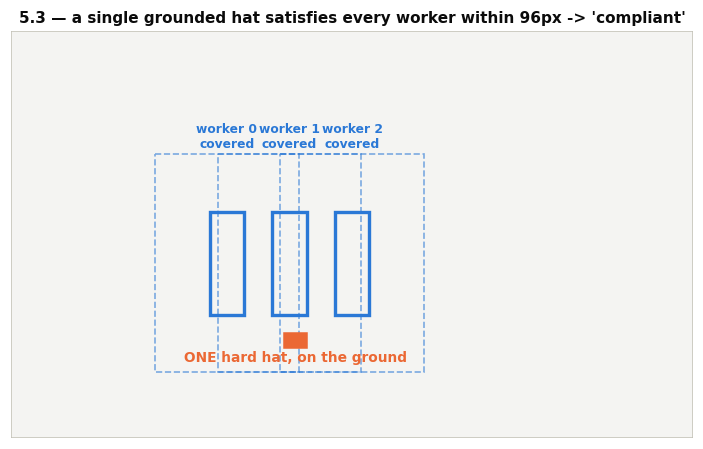


INTERPRETATION: not one worker here is wearing anything, and there is only a
single hat -- on the ground -- yet the proxy returns 'compliant'. One object
satisfied all three workers because matching is any-to-any. This is a property
of the geometry, not a model error, which is exactly why every metric that
follows must be read as measuring the proxy rather than the model.


In [15]:
stage("5.3 demonstrate the any-to-any matching gap",
      "synthetic worker/object geometry at the real rule_1 threshold",
      "coverage verdict showing one object satisfying several workers")

from xai_pilot.regions import fraction_covered

W, H = 1200, 675
thr = 0.08 * max(W, H)  # the real rule_1 threshold for an image this size

# Three workers standing in a row, and a SINGLE hard hat sitting on the ground between
# them -- touching nobody's head. Geometry only; no model involved. Spacing is chosen so
# every worker's nearest edge falls inside the real threshold; the distances are printed
# below so the verdict can be checked by hand rather than taken on trust.
workers = [(350, 300, 410, 470), (460, 300, 520, 470), (570, 300, 630, 470)]
hat = (480, 500, 520, 525)

print(f"threshold for a {W}x{H} image: {thr:.0f}px")
for i, w in enumerate(workers):
    dx = max(hat[0] - w[2], w[0] - hat[2], 0.0)
    dy = max(hat[1] - w[3], w[1] - hat[3], 0.0)
    print(f"   worker {i}: edge distance to the hat = {np.hypot(dx, dy):5.1f}px  "
          f"-> {'covered' if boxes_overlap_or_close(w, hat, distance_threshold=thr) else 'UNCOVERED'}")

frac = fraction_covered(workers, [hat], distance_threshold=thr)
verdict = "compliant" if frac >= 1.0 else "violation"
print(f"\n3 workers, 1 hard hat on the ground -> graded score {frac:.2f} -> VERDICT: {verdict}")

fig, ax = plt.subplots(figsize=(8, 4.8))
ax.add_patch(mpatches.Rectangle((0, 0), W, H, facecolor="#f4f4f2", edgecolor=BASELINE))
for i, w in enumerate(workers):
    x0, y0, x1, y1 = w
    covered = boxes_overlap_or_close(w, hat, distance_threshold=thr)
    col = ACCENT if covered else GT_COLOR
    ax.add_patch(mpatches.Rectangle((x0, y0), x1 - x0, y1 - y0, fill=False, edgecolor=col, linewidth=2.2))
    ax.add_patch(mpatches.Rectangle((x0 - thr, y0 - thr), (x1 - x0) + 2 * thr, (y1 - y0) + 2 * thr,
                                    fill=False, edgecolor=col, linewidth=1.1, linestyle="--", alpha=0.6))
    ax.text((x0 + x1) / 2, y0 - thr - 12, f"worker {i}\n{'covered' if covered else 'uncovered'}",
            ha="center", fontsize=FS_SMALL, color=col, fontweight="bold")
x0, y0, x1, y1 = hat
ax.add_patch(mpatches.Rectangle((x0, y0), x1 - x0, y1 - y0, facecolor=ACCENT_2, edgecolor=ACCENT_2))
ax.text((x0 + x1) / 2, y1 + 22, "ONE hard hat, on the ground", ha="center", fontsize=FS_BODY,
        color=ACCENT_2, fontweight="bold")
ax.set_xlim(0, W); ax.set_ylim(H, 0); ax.axis("off")
ax.set_title(f"5.3 — a single grounded hat satisfies every worker within {thr:.0f}px "
             f"-> '{verdict}'", fontsize=FS_LABEL)
plt.show()

print()
if frac >= 1.0:
    print("INTERPRETATION: not one worker here is wearing anything, and there is only a")
    print(f"single hat -- on the ground -- yet the proxy returns '{verdict}'. One object")
    print("satisfied all three workers because matching is any-to-any. This is a property")
    print("of the geometry, not a model error, which is exactly why every metric that")
    print("follows must be read as measuring the proxy rather than the model.")
else:
    # Guard: if the geometry ever stops demonstrating the point, say so rather than
    # printing a conclusion the numbers do not support.
    print(f"NOTE: this configuration scored {frac:.2f} -> '{verdict}', so it does NOT")
    print("illustrate the any-to-any gap. Adjust the spacing until every worker's edge")
    print(f"distance is below {thr:.0f}px.")

### 5.4 A third gap: the rule's scope is wider than the phrase it grounds

`rule_1` is labelled "PPE violation" in the dataset, and its written reasons cover PPE
*in general* — hard hats, high-visibility vests, long trousers, shoulder coverage. The
pipeline, however, grounds a **single** phrase:

```python
phrase = RULE_QUERIES[rule_id][phrasing_index]   # inference.py, phrasing_index = 0
```

`RULE_QUERIES["rule_1"]` contains `["hard hat", "high-visibility vest"]`, but only index 0
is used on the frozen path — the vest phrase is defined and never queried.

So any `rule_1` violation that is not about a hard hat cannot be detected, no matter how
good the model is. The cell below measures how large that blind spot is.

+------------------------------------------------------------------------------
| STAGE : 5.4 quantify the rule-scope mismatch
| IN    : rule_1 violation reasons from the test split
| OUT   : share of violations the grounded phrase cannot possibly capture
+------------------------------------------------------------------------------


rule_1 violation reasons scanned: 136
grounded phrase actually used   : 'hard hat'
defined but never queried       : ['high-visibility vest']

   mention hard hat / helmet     113  (83.1%)
   mention hi-vis vest             9  (6.6%)
   mention trousers / shorts      14  (10.3%)
   mention generic "PPE"          11  (8.1%)

   NO hard-hat mention at all     23  (16.9%)  <- undetectable by construction

examples the pipeline cannot possibly catch:
   - person on the left not using ppe.
   - workers next to the truck on the left not wearing high visibility vests.
   - none of the workers are wearing high visibility vests when working at night.
   - the worker is not wearing long pants.
   - the worker on the right next to the blue gate is not wearing clothes that can cover the shoulder


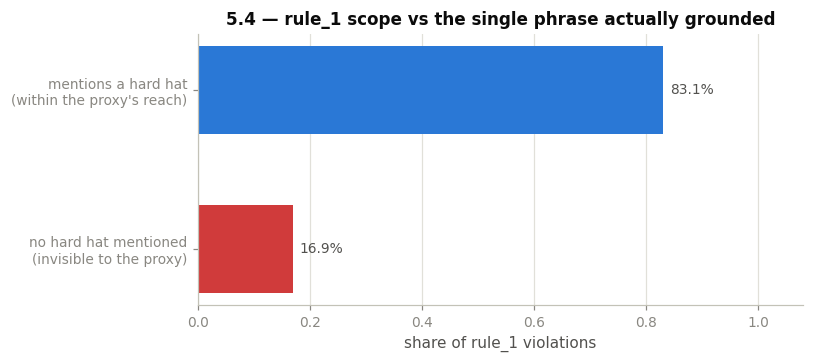

INTERPRETATION: 16.9% of rule_1 violations concern PPE other than a
hard hat. The pipeline grounds only 'hard hat', so these are false negatives that no
amount of model improvement can fix -- the question was never asked. Any rule_1
sensitivity figure in this notebook should be read against this ceiling.


In [16]:
stage("5.4 quantify the rule-scope mismatch",
      "rule_1 violation reasons from the test split",
      "share of violations the grounded phrase cannot possibly capture")

reasons = []
for row in itertools.islice(load_construction_site(split="test", streaming=True), 1200):
    v = row.get("rule_1_violation")
    if isinstance(v, dict) and v.get("reason"):
        reasons.append(v["reason"].lower())

def mentions(rs, *words):
    return sum(1 for r in rs if any(w in r for w in words))

buckets = {
    "hard hat / helmet": mentions(reasons, "hard hat", "hardhat", "helmet"),
    "hi-vis vest":       mentions(reasons, "vest", "hi-vis", "visibility"),
    "trousers / shorts": mentions(reasons, "pant", "short"),
    'generic "PPE"':     mentions(reasons, "ppe"),
}
no_hh = [r for r in reasons if not any(w in r for w in ("hard hat", "hardhat", "helmet"))]

print(f"rule_1 violation reasons scanned: {len(reasons)}")
print(f"grounded phrase actually used   : {RULE_QUERIES['rule_1'][0]!r}")
print(f"defined but never queried       : {RULE_QUERIES['rule_1'][1:]}\n")
for k, v in buckets.items():
    print(f"   mention {k:<20} {v:4d}  ({v/len(reasons):.1%})")
print(f"\n   NO hard-hat mention at all   {len(no_hh):4d}  ({len(no_hh)/len(reasons):.1%})"
      "  <- undetectable by construction")
print("\nexamples the pipeline cannot possibly catch:")
for r in no_hh[:5]:
    print(f"   - {r[:96]}")

fig, ax = plt.subplots(figsize=(7.5, 3.4))
style_ax(ax)
detectable = len(reasons) - len(no_hh)
bars = ax.barh([1, 0], [detectable / len(reasons), len(no_hh) / len(reasons)],
               color=[ACCENT, GT_COLOR], height=0.55)
ax.set_yticks([1, 0])
ax.set_yticklabels(["mentions a hard hat\n(within the proxy's reach)",
                    "no hard hat mentioned\n(invisible to the proxy)"], fontsize=FS_BODY)
for b, v in zip(bars, [detectable / len(reasons), len(no_hh) / len(reasons)]):
    ax.text(v + 0.012, b.get_y() + b.get_height() / 2, f"{v:.1%}",
            va="center", fontsize=FS_BODY, color=SECONDARY)
ax.set_xlim(0, 1.08); ax.set_xlabel("share of rule_1 violations")
ax.xaxis.grid(True, color=GRID, linewidth=0.8); ax.yaxis.grid(False); ax.set_axisbelow(True)
ax.set_title("5.4 — rule_1 scope vs the single phrase actually grounded")
fig.tight_layout(); plt.show()

print(f"INTERPRETATION: {len(no_hh)/len(reasons):.1%} of rule_1 violations concern PPE other than a")
print("hard hat. The pipeline grounds only 'hard hat', so these are false negatives that no")
print("amount of model improvement can fix -- the question was never asked. Any rule_1")
print("sensitivity figure in this notebook should be read against this ceiling.")

## 6. One image, traced end to end

**In:** a single image and its assigned rule.
**Out:** every intermediate artifact, one subsection per step, ending with the model's
verdict placed beside the dataset's written ground-truth reason.

### 6.1 Step 1 — ground the phrase `"worker"`

+------------------------------------------------------------------------------
| STAGE : 6.1 detect workers
| IN    : image 0000095, phrase 'worker'
| OUT   : worker boxes + confidence
+------------------------------------------------------------------------------


SAMPLE OUTPUT: 1 box(es), mean token prob 0.593
   worker 0: (205, 88, 247, 202)


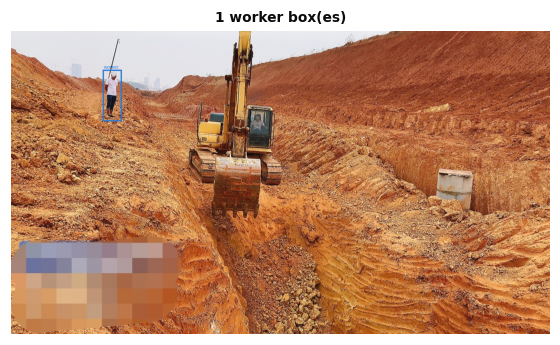

In [17]:
stage("6.1 detect workers", f"image {demo.image_id}, phrase 'worker'", "worker boxes + confidence")
w_boxes, w_conf = _detect(model, processor, demo_img, PERSON_PHRASE)
print(f"SAMPLE OUTPUT: {len(w_boxes)} box(es), mean token prob {w_conf:.3f}")
for i, b in enumerate(w_boxes):
    print(f"   worker {i}: {tuple(round(v) for v in b)}")
show_images([overlay_boxes(demo_img, w_boxes, ["worker"] * len(w_boxes), color=ACCENT)],
            [f"{len(w_boxes)} worker box(es)"], figsize_each=(5.2, 4.0))

### 6.2 Step 2 — ground the rule's safety object

+------------------------------------------------------------------------------
| STAGE : 6.2 detect safety object
| IN    : image 0000095, phrase 'hard hat'
| OUT   : object boxes + confidence
+------------------------------------------------------------------------------


SAMPLE OUTPUT: 1 box(es), mean token prob 0.591
   hard hat 0: (219, 88, 242, 115)

NOTE: the returned label is discarded (see 5.3a) -- these are accepted as
'hard hat' purely because that is the phrase that was queried.


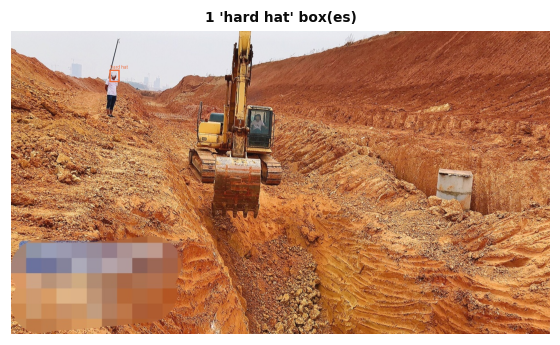

In [18]:
stage("6.2 detect safety object", f"image {demo.image_id}, phrase {obj_phrase!r}",
      "object boxes + confidence")
o_boxes, o_conf = _detect(model, processor, demo_img, obj_phrase)
print(f"SAMPLE OUTPUT: {len(o_boxes)} box(es), mean token prob {o_conf:.3f}")
for i, b in enumerate(o_boxes):
    print(f"   {obj_phrase} {i}: {tuple(round(v) for v in b)}")
print("\nNOTE: the returned label is discarded (see 5.3a) -- these are accepted as")
print(f"'{obj_phrase}' purely because that is the phrase that was queried.")
show_images([overlay_boxes(demo_img, o_boxes, [obj_phrase] * len(o_boxes), color=ACCENT_2)],
            [f"{len(o_boxes)} '{obj_phrase}' box(es)"], figsize_each=(5.2, 4.0))

### 6.3 Step 3 — apply the proximity test and read off the verdict

In [19]:
stage("6.3 geometric verdict", "worker boxes + object boxes + threshold",
      "answer, graded_score, confidence, latency")
res = answer_rule(model, processor, demo_img, demo_rule)
print(f"graded score (fraction of workers covered): {res.graded_score}")
print(f"VERDICT   : {res.answer.upper()}")
print(f"confidence: {res.confidence:.3f}   latency: {res.inference_ms:.0f} ms")

+------------------------------------------------------------------------------
| STAGE : 6.3 geometric verdict
| IN    : worker boxes + object boxes + threshold
| OUT   : answer, graded_score, confidence, latency
+------------------------------------------------------------------------------


graded score (fraction of workers covered): 1.0
VERDICT   : COMPLIANT
confidence: 0.592   latency: 240 ms


### 6.4 Model verdict vs the dataset's written ground truth

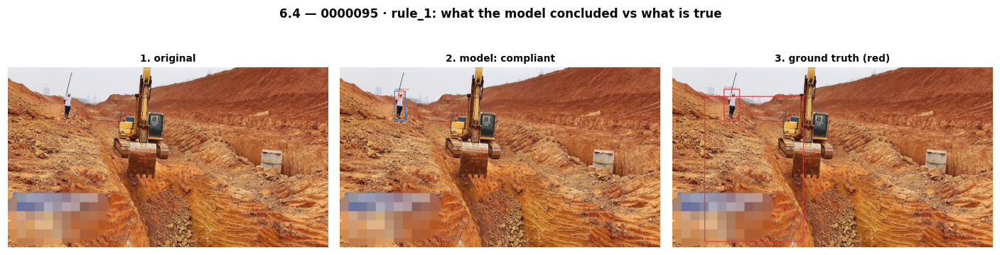

model verdict   : compliant
true class      : ppe_violation
dataset reason  : [rule_1] The worker is not wearing long pants.
dataset reason  : [rule_3] Either side of the excavation trench is protected.

INTERPRETATION: compare the two. The model produced a verdict from box geometry
alone; the dataset's reason is a semantic statement about who is unprotected. The
pipeline has no mechanism that could produce the latter -- which is the gap §5.3
describes, shown here on a real sample.


In [20]:
both = overlay_boxes(demo_img, w_boxes, ["worker"] * len(w_boxes), color=ACCENT)
both = overlay_boxes(both, o_boxes, [obj_phrase] * len(o_boxes), color=ACCENT_2)
gt_canvas = demo_img
for rule, (boxes, _) in GT[demo.image_id].items():
    if boxes:
        gt_canvas = overlay_boxes(gt_canvas, boxes, [f"GT {rule}"] * len(boxes), color=GT_COLOR)

show_images([demo_img, both, gt_canvas],
            ["1. original",
             f"2. model: {res.answer}",
             "3. ground truth (red)"],
            figsize_each=(4.3, 3.4),
            suptitle=f"6.4 — {demo.image_id} · {demo_rule}: what the model concluded vs what is true")

print(f"model verdict   : {res.answer}")
print(f"true class      : {demo.primary_class}")
for rule, (_, reason) in GT[demo.image_id].items():
    print(f"dataset reason  : [{rule}] {reason}")
print()
print("INTERPRETATION: compare the two. The model produced a verdict from box geometry")
print("alone; the dataset's reason is a semantic statement about who is unprotected. The")
print("pipeline has no mechanism that could produce the latter -- which is the gap §5.3")
print("describes, shown here on a real sample.")

## 7. Baseline inference across the subset

**In:** all 16 samples with their assigned rules.
**Out:** one verdict per sample, scored against ground truth, plus a per-image gallery
showing where the model looked and what the dataset says was actually wrong.

### 7.1 Run the rule for every sample

In [21]:
def expected_answer(sample):
    # Ground-truth verdict for a sample under its assigned rule.
    if sample.assigned_rule_id == "rule_4":
        return "safe" if sample.primary_class == "compliant" else "hazard"
    return "compliant" if sample.primary_class == "compliant" else "violation"

stage("7.1 baseline inference", "16 images x assigned rule",
      "AnswerResult each: answer, boxes, graded_score, confidence, latency")

BASE = {s.image_id: answer_rule(model, processor, IMAGES[s.image_id], s.assigned_rule_id)
        for s in samples}

base_df = pd.DataFrame([{
    "image_id": s.image_id, "primary_class": s.primary_class, "rule": s.assigned_rule_id,
    "expected": expected_answer(s), "predicted": BASE[s.image_id].answer,
    "correct": BASE[s.image_id].answer == expected_answer(s),
    "n_workers": len(BASE[s.image_id].worker_boxes),
    "n_objects": len(BASE[s.image_id].object_boxes),
    "graded_score": BASE[s.image_id].graded_score,
    "confidence": BASE[s.image_id].confidence,
    "ms": BASE[s.image_id].inference_ms,
} for s in samples])
print(base_df.to_string(index=False, float_format=lambda v: f"{v:.3f}"))
print(f"\nsubset accuracy: {base_df['correct'].mean():.1%}")
below_floor_banner(len(base_df), "baseline accuracy")

+------------------------------------------------------------------------------
| STAGE : 7.1 baseline inference
| IN    : 16 images x assigned rule
| OUT   : AnswerResult each: answer, boxes, graded_score, confidence, latency
+------------------------------------------------------------------------------


image_id  primary_class   rule  expected predicted  correct  n_workers  n_objects  graded_score  confidence      ms
 0000095  ppe_violation rule_1 violation compliant    False          1          1         1.000       0.592 248.983
 0000019  ppe_violation rule_1 violation violation     True          1          1         0.000       0.572 247.346
 0000102  ppe_violation rule_1 violation compliant    False          1          1         1.000       0.582 241.436
 0000599  ppe_violation rule_1 violation compliant    False          1          1         1.000       0.555 223.167
 0000468    fall_hazard rule_3 violation compliant    False          1          1         1.000       0.559 234.963
 0000478    fall_hazard rule_3 violation compliant    False          1          1         1.000       0.528 228.718
 0000443    fall_hazard rule_3 violation compliant    False          1          2         1.000       0.534 265.330
 0000020    fall_hazard rule_3 violation compliant    False          1  

### 7.2 Per-image gallery — model detections vs ground-truth violation

Blue = detected worker, orange = detected safety object, **red = the dataset's
ground-truth violation region**. The caption gives predicted vs expected; the printed
list below gives the dataset's stated reason for every sample the model got wrong.

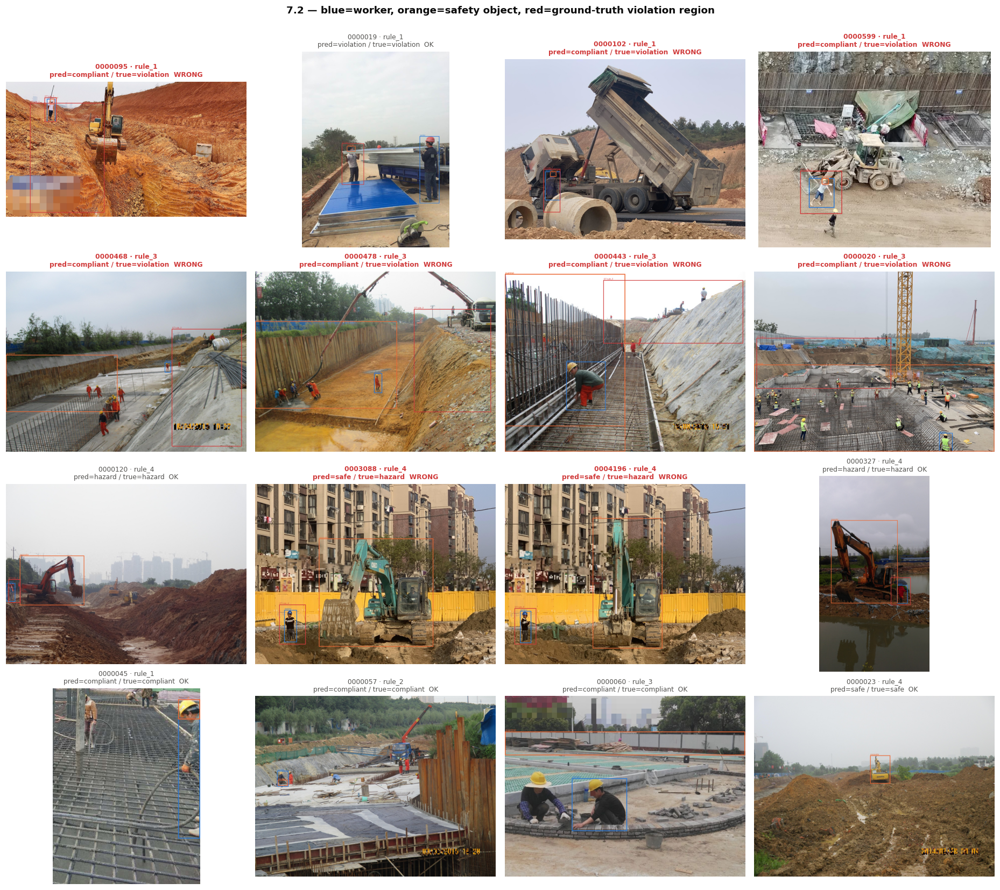

Dataset's stated reason for each MISCLASSIFIED sample:

0000095 · rule_1: predicted 'compliant', expected 'violation'  (workers=1, objects=1)
      GT [rule_1]: The worker is not wearing long pants.
      GT [rule_3]: Either side of the excavation trench is protected.
0000102 · rule_1: predicted 'compliant', expected 'violation'  (workers=1, objects=1)
      GT [rule_1]: The mechanic in front of the truck is not wearing a hard hat.
0000599 · rule_1: predicted 'compliant', expected 'violation'  (workers=1, objects=1)
      GT [rule_1]: A worker in the lower left is wearing short pants.
0000468 · rule_3: predicted 'compliant', expected 'violation'  (workers=1, objects=1)
      GT [rule_3]: The edge of excavation on the right is not guarded.
0000478 · rule_3: predicted 'compliant', expected 'violation'  (workers=1, objects=1)
      GT [rule_3]: The excavation bank on the right is not protected with edge protections.
0000443 · rule_3: predicted 'compliant', expected 'violation'  (workers=1

In [22]:
fig, axes = plt.subplots(4, 4, figsize=(17, 15))
for ax, s in zip(axes.ravel(), samples):
    r = BASE[s.image_id]
    canvas = IMAGES[s.image_id]
    if r.worker_boxes:
        canvas = overlay_boxes(canvas, r.worker_boxes, ["worker"] * len(r.worker_boxes), color=ACCENT)
    if r.object_boxes:
        lbl = RULE_OBJECT_LABEL[s.assigned_rule_id]
        canvas = overlay_boxes(canvas, r.object_boxes, [lbl] * len(r.object_boxes), color=ACCENT_2)
    for rule, (boxes, _) in GT[s.image_id].items():
        if boxes:
            canvas = overlay_boxes(canvas, boxes, [f"GT {rule}"] * len(boxes), color=GT_COLOR)
    exp = expected_answer(s)
    ok = r.answer == exp
    ax.imshow(canvas); ax.axis("off")
    ax.set_title(f"{s.image_id} · {s.assigned_rule_id}\npred={r.answer} / true={exp}  "
                 f"{'OK' if ok else 'WRONG'}",
                 fontsize=FS_SMALL, color=(SECONDARY if ok else GT_COLOR),
                 fontweight=("normal" if ok else "bold"))
fig.suptitle("7.2 — blue=worker, orange=safety object, red=ground-truth violation region",
             fontsize=FS_SUPTITLE, fontweight="bold", y=1.0)
fig.tight_layout(); plt.show()

print("Dataset's stated reason for each MISCLASSIFIED sample:\n")
for s in samples:
    if BASE[s.image_id].answer == expected_answer(s):
        continue
    r = BASE[s.image_id]
    print(f"{s.image_id} · {s.assigned_rule_id}: predicted '{r.answer}', expected "
          f"'{expected_answer(s)}'  (workers={len(r.worker_boxes)}, objects={len(r.object_boxes)})")
    for rule, (_, reason) in GT[s.image_id].items():
        print(f"      GT [{rule}]: {reason}")
    if not GT[s.image_id]:
        print("      GT: compliant image (no violation recorded)")

### 7.3 Where the errors concentrate

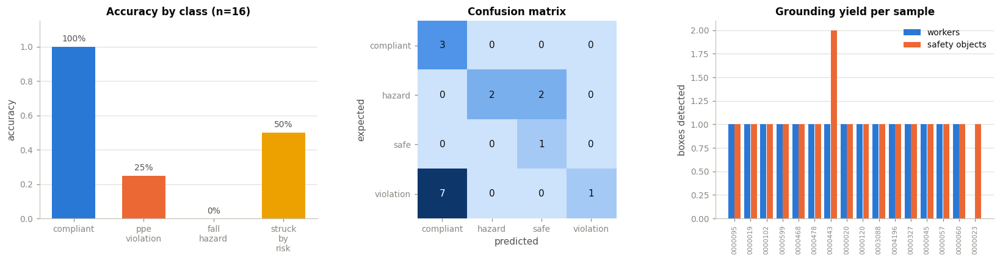

INTERPRETATION: 1/16 samples detected no worker at all. Those
fall back to a scene-level existence check (compliant iff the object exists
anywhere), which answers for a completely different reason than the per-worker
rule. That fallback is the origin of the 'worker-loss' artifact quantified in §9
and §13.


In [23]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

ax = style_ax(axes[0])
acc = base_df.groupby("primary_class")["correct"].mean().reindex(CLASS_ORDER)
bars = ax.bar(range(4), acc.values, color=[CLASS_COLORS[c] for c in CLASS_ORDER], width=0.62)
label_bars(ax, bars, fmt="{:.0%}", dy=0.02)
ax.set_xticks(range(4)); ax.set_xticklabels([c.replace("_", "\n") for c in CLASS_ORDER], fontsize=FS_BODY)
ax.set_ylim(0, 1.15); ax.set_ylabel("accuracy"); ax.set_title(f"Accuracy by class (n={len(base_df)})")

ax = axes[1]
lp, le = sorted(base_df["predicted"].unique()), sorted(base_df["expected"].unique())
cm = np.zeros((len(le), len(lp)), dtype=int)
for _, r in base_df.iterrows():
    cm[le.index(r["expected"]), lp.index(r["predicted"])] += 1
ax.imshow(cm, cmap=SEQ)
ax.set_xticks(range(len(lp))); ax.set_xticklabels(lp, fontsize=FS_BODY)
ax.set_yticks(range(len(le))); ax.set_yticklabels(le, fontsize=FS_BODY)
ax.set_xlabel("predicted"); ax.set_ylabel("expected"); ax.set_title("Confusion matrix")
for a in range(cm.shape[0]):
    for b in range(cm.shape[1]):
        ax.text(b, a, cm[a, b], ha="center", va="center",
                color="white" if cm[a, b] > cm.max() * 0.55 else INK)
for s_ in ax.spines.values():
    s_.set_visible(False)

ax = style_ax(axes[2])
x = np.arange(len(base_df))
ax.bar(x - 0.2, base_df["n_workers"], width=0.38, color=ACCENT, label="workers")
ax.bar(x + 0.2, base_df["n_objects"], width=0.38, color=ACCENT_2, label="safety objects")
ax.set_xticks(x); ax.set_xticklabels(base_df["image_id"], rotation=90, fontsize=FS_DENSE)
ax.set_ylabel("boxes detected"); ax.set_title("Grounding yield per sample")
ax.legend(frameon=False, fontsize=FS_BODY)

fig.tight_layout(); plt.show()

zero_w = (base_df["n_workers"] == 0).sum()
print(f"INTERPRETATION: {zero_w}/{len(base_df)} samples detected no worker at all. Those")
print("fall back to a scene-level existence check (compliant iff the object exists")
print("anywhere), which answers for a completely different reason than the per-worker")
print("rule. That fallback is the origin of the 'worker-loss' artifact quantified in §9")
print("and §13.")

## 8. Standardizing explanation regions

**In:** the worker and object boxes from §7, plus the image size.
**Out:** a *ranked* list of candidate explanation regions per sample — the input every
masking metric consumes.

The frozen policy (`REGION_RANKING="area"`) ranks the model's boxes by area, largest
first, as a pragmatic importance proxy. When the model returned no box at all, a 4×4 grid
fallback is used instead and the sample is marked `grid`.

In [24]:
from xai_pilot.regions import standardize_regions, mask_region

stage("8 rank explanation regions",
      "worker + object boxes, labels, image size, ranking policy",
      "ordered list of Region(box, source, label); Region[0] is masked first")

REGIONS = {}
for s in samples:
    r = BASE[s.image_id]
    labels = (["worker"] * len(r.worker_boxes)
              + [RULE_OBJECT_LABEL[s.assigned_rule_id]] * len(r.object_boxes))
    REGIONS[s.image_id] = standardize_regions(
        r.worker_boxes + r.object_boxes, labels,
        image_size=IMAGES[s.image_id].size,
        region_ranking=config.REGION_RANKING,
        object_labels=rule_object_labels(s.assigned_rule_id),
    )

ex_id = samples[0].image_id
print(f"SAMPLE OUTPUT for {ex_id}:")
for i, rg in enumerate(REGIONS[ex_id]):
    area = (rg.box[2] - rg.box[0]) * (rg.box[3] - rg.box[1])
    print(f"   rank {i+1}: label={rg.label:<12} source={rg.source:<6} "
          f"area={area:>10,.0f}px2  box={tuple(round(v) for v in rg.box)}")

reg_df = pd.DataFrame([{
    "image_id": s.image_id, "rule": s.assigned_rule_id,
    "n_regions": len(REGIONS[s.image_id]),
    "top_source": REGIONS[s.image_id][0].source,
    "top_label": REGIONS[s.image_id][0].label,
} for s in samples])
print()
print(reg_df.to_string(index=False))

+------------------------------------------------------------------------------
| STAGE : 8 rank explanation regions
| IN    : worker + object boxes, labels, image size, ranking policy
| OUT   : ordered list of Region(box, source, label); Region[0] is masked first
+------------------------------------------------------------------------------
SAMPLE OUTPUT for 0000095:
   rank 1: label=worker       source=model  area=     4,791px2  box=(205, 88, 247, 202)
   rank 2: label=hard hat     source=model  area=       616px2  box=(219, 88, 242, 115)

image_id   rule  n_regions top_source top_label
 0000095 rule_1          2      model    worker
 0000019 rule_1          2      model    worker
 0000102 rule_1          2      model    worker
 0000599 rule_1          2      model    worker
 0000468 rule_3          2      model guardrail
 0000478 rule_3          2      model guardrail
 0000443 rule_3          3      model guardrail
 0000020 rule_3          2      model guardrail
 0000120 rule_4    

In [25]:
grid_rate = (reg_df["top_source"] == "grid").mean()
model_rows = reg_df[reg_df["top_source"] == "model"]
print(f"grid-fallback rate (model returned no box at all): {grid_rate:.1%}\n")

# The bias is NOT uniform across rules, and a pooled rate hides that. Worn PPE
# (rules 1-2) is physically small; guardrails and excavators (rules 3-4) are not.
WORN_PPE = {"rule_1", "rule_2"}
model_rows = model_rows.assign(
    family=np.where(model_rows["rule"].isin(WORN_PPE), "worn PPE (rules 1-2)",
                    "large object (rules 3-4)"),
    worker_is_top1=model_rows["top_label"] == "worker",
)
by_family = model_rows.groupby("family").agg(n=("rule", "size"),
                                             worker_top1_rate=("worker_is_top1", "mean"))
print(by_family.to_string(formatters={"worker_top1_rate": lambda v: f"{v:.1%}"}))
print(f"\noverall worker-top1 rate: {(model_rows['worker_is_top1']).mean():.1%}  "
      "<- this aggregate is misleading")
print("\nINTERPRETATION: for worn PPE the worker's body box outranks the small safety")
print("object essentially always, so masking tests the worker rather than the hard hat the")
print("rule asks about. For rules 3-4 the queried object is itself large, so area ranking")
print("happens to pick the right region and the bias never fires. The frozen pilot reports")
print("~96% on its PPE samples. This is what REGION_RANKING='rule_aware' was built to fix.")

grid-fallback rate (model returned no box at all): 0.0%

                           n worker_top1_rate
family                                       
large object (rules 3-4)  10             0.0%
worn PPE (rules 1-2)       6           100.0%

overall worker-top1 rate: 37.5%  <- this aggregate is misleading

INTERPRETATION: for worn PPE the worker's body box outranks the small safety
object essentially always, so masking tests the worker rather than the hard hat the
rule asks about. For rules 3-4 the queried object is itself large, so area ranking
happens to pick the right region and the bias never fires. The frozen pilot reports
~96% on its PPE samples. This is what REGION_RANKING='rule_aware' was built to fix.


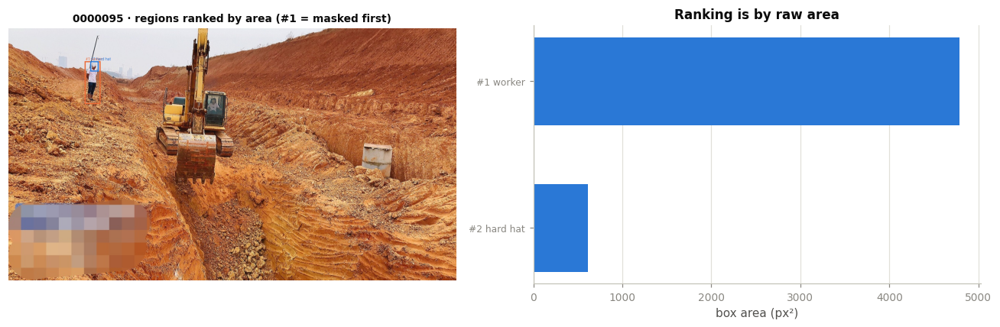

In [26]:
ex = next(s for s in samples if REGIONS[s.image_id][0].source == "model")
regs = REGIONS[ex.image_id][:3]
palette_rank = [ACCENT_2, ACCENT, ACCENT_3]
ranked = IMAGES[ex.image_id]
for i, rg in enumerate(regs):
    ranked = overlay_boxes(ranked, [rg.box], [f"#{i+1} {rg.label}"], color=palette_rank[i])
areas = [(b.box[2] - b.box[0]) * (b.box[3] - b.box[1]) for b in REGIONS[ex.image_id]]

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].imshow(ranked); axes[0].axis("off")
axes[0].set_title(f"{ex.image_id} · regions ranked by area (#1 = masked first)", fontsize=FS_BODY)
ax = style_ax(axes[1])
lbls = [f"#{i+1} {r.label}" for i, r in enumerate(REGIONS[ex.image_id])]
ax.barh(range(len(areas))[::-1], areas, color=ACCENT, height=0.6)
ax.set_yticks(range(len(areas))[::-1]); ax.set_yticklabels(lbls, fontsize=FS_SMALL)
ax.set_xlabel("box area (px²)"); ax.set_title("Ranking is by raw area")
ax.xaxis.grid(True, color=GRID, linewidth=0.8); ax.yaxis.grid(False); ax.set_axisbelow(True)
fig.tight_layout(); plt.show()

## 9. Metric 1 — Descriptive Accuracy

> *Does masking the top-ranked explanation region flip the model's answer?*

**In:** each image, its ranked regions, and its baseline `AnswerResult`.
**Out:** per sample — whether the answer flipped after masking top-1, and after masking
top-1 + top-2 cumulatively; the continuous graded-score drop; and whether the flip was
contaminated by worker loss.

A region that genuinely drives the decision should change the answer when removed. Two
signals beyond the boolean flip are recorded:

- **`graded_score_drop`** — the continuous change in worker-coverage, so a mask that
  weakens evidence without flipping the verdict still registers.
- **`flip_due_to_worker_loss`** — whether the mask made the *worker* undetectable, which
  reroutes the proxy into the scene-level fallback (§7.3) and flips the answer for a
  reason unrelated to the safety concept. A contaminated flip, not a genuine one.

In [27]:
from xai_pilot.metrics import descriptive_accuracy

stage("9 descriptive accuracy",
      "image, rule, baseline AnswerResult, ranked regions; mask_mode='black'",
      "flip flags (top1/top2), graded-score drops, worker-loss flags, non-monotonic flag")

DA = {s.image_id: descriptive_accuracy.evaluate(
        model, processor, IMAGES[s.image_id], s.assigned_rule_id,
        BASE[s.image_id], REGIONS[s.image_id], mask_mode="black")
      for s in samples}

da_df = pd.DataFrame([{
    "image_id": s.image_id, "class": s.primary_class,
    "baseline": BASE[s.image_id].answer,
    "masked_top1": DA[s.image_id].masked_answer_top1,
    "flip_top1": DA[s.image_id].answer_changed_top1,
    "flip_top2": DA[s.image_id].answer_changed_top2,
    "graded_drop_top1": DA[s.image_id].graded_score_drop_top1,
    "worker_lost_top1": DA[s.image_id].worker_lost_top1,
    "contaminated": DA[s.image_id].flip_due_to_worker_loss_top1,
    "non_monotonic": DA[s.image_id].non_monotonic,
} for s in samples])
print(da_df.to_string(index=False, float_format=lambda v: f"{v:.3f}"))

raw = (da_df["flip_top1"] | da_df["flip_top2"]).mean()
genuine = ((da_df["flip_top1"] & ~da_df["contaminated"]) | da_df["flip_top2"]).mean()
print(f"\nraw flip rate     : {raw:.1%}")
print(f"genuine flip rate : {genuine:.1%}  (worker-loss flips discounted)")
below_floor_banner(len(da_df), "descriptive accuracy")

+------------------------------------------------------------------------------
| STAGE : 9 descriptive accuracy
| IN    : image, rule, baseline AnswerResult, ranked regions; mask_mode='black'
| OUT   : flip flags (top1/top2), graded-score drops, worker-loss flags, non-monotonic flag
+------------------------------------------------------------------------------


image_id          class  baseline masked_top1  flip_top1  flip_top2  graded_drop_top1  worker_lost_top1  contaminated  non_monotonic
 0000095  ppe_violation compliant   compliant      False      False             0.000             False         False          False
 0000019  ppe_violation violation   compliant       True      False            -1.000             False         False           True
 0000102  ppe_violation compliant   compliant      False      False             0.000             False         False          False
 0000599  ppe_violation compliant   compliant      False      False             0.000             False         False          False
 0000468    fall_hazard compliant   compliant      False      False             0.000             False         False          False
 0000478    fall_hazard compliant   violation       True       True             1.000             False         False          False
 0000443    fall_hazard compliant   compliant      False      False  

### 9.1 What masking actually looks like

The panels below show one sample's masking sequence. The caption reports the answer at
each stage, and the ground-truth reason is printed underneath so the flip (or its absence)
can be judged against what was actually wrong in the image.

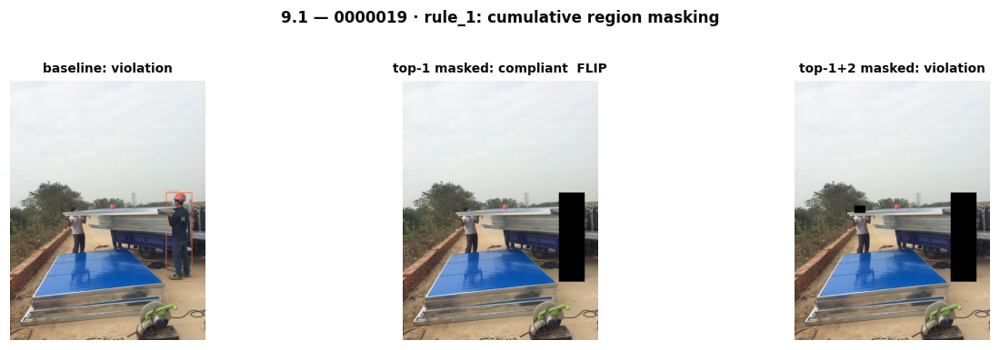

region masked first: worker (source=model)
ground truth [rule_1]: Worker with a black hard hat and white shirt on the left is not wearing a hard hat.


In [28]:
from xai_pilot.stats import bootstrap_ci

flipped = da_df[da_df["flip_top1"]]
demo_id = flipped.iloc[0]["image_id"] if len(flipped) else da_df.iloc[0]["image_id"]
s_demo = next(s for s in samples if s.image_id == demo_id)
im, rgs, d = IMAGES[demo_id], REGIONS[demo_id], DA[demo_id]
m1 = mask_region(im, rgs[0].box, mode="black")
m2 = mask_region(m1, rgs[1].box, mode="black") if len(rgs) > 1 else m1

show_images([overlay_boxes(im, [rgs[0].box], [f"top-1 {rgs[0].label}"], color=ACCENT_2), m1, m2],
            [f"baseline: {BASE[demo_id].answer}",
             f"top-1 masked: {d.masked_answer_top1}" + ("  FLIP" if d.answer_changed_top1 else ""),
             f"top-1+2 masked: {d.masked_answer_top2}" + ("  FLIP" if d.answer_changed_top2 else "")],
            figsize_each=(4.3, 3.4),
            suptitle=f"9.1 — {demo_id} · {s_demo.assigned_rule_id}: cumulative region masking")

print(f"region masked first: {rgs[0].label} (source={rgs[0].source})")
for rule, (_, reason) in GT[demo_id].items():
    print(f"ground truth [{rule}]: {reason}")
if not GT[demo_id]:
    print("ground truth: compliant image (no violation recorded)")

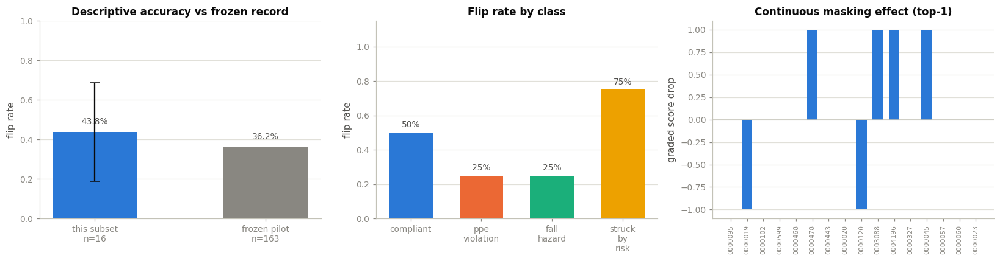

subset flip rate 43.8%  95% bootstrap CI [18.8%, 68.8%]
frozen 163-sample record: 36.2%   <- the number to quote

contaminated flips: 0/16
non-monotonic samples (top-1 flipped, top-2 un-flipped): 3
INTERPRETATION: non-monotonicity should be impossible if masking only removes
evidence. It is the signature of the scene-level fallback interacting with the mask.


In [29]:
frozen_summary = pd.read_csv(RESULTS_DIR / "pilot_metric_summary.csv")
FROZEN_DA = float(frozen_summary.loc[frozen_summary["metric"] == "descriptive_accuracy", "overall"].iloc[0])
ci = bootstrap_ci((da_df["flip_top1"] | da_df["flip_top2"]).astype(float).values, n_boot=5000, seed=0)

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
ax = style_ax(axes[0])
bars = ax.bar([0, 1], [ci["point"], FROZEN_DA], color=[ACCENT, MUTED], width=0.5)
ax.errorbar([0], [ci["point"]], yerr=[[ci["point"] - ci["lo"]], [ci["hi"] - ci["point"]]],
            fmt="none", ecolor=INK, capsize=5, linewidth=1.5)
label_bars(ax, bars, fmt="{:.1%}", dy=0.03)
ax.set_xticks([0, 1]); ax.set_xticklabels([f"this subset\nn={len(da_df)}", "frozen pilot\nn=163"], fontsize=FS_BODY)
ax.set_ylim(0, 1.0); ax.set_ylabel("flip rate"); ax.set_title("Descriptive accuracy vs frozen record")

ax = style_ax(axes[1])
by_class = da_df.assign(f=da_df["flip_top1"] | da_df["flip_top2"]).groupby("class")["f"].mean().reindex(CLASS_ORDER)
bars = ax.bar(range(4), by_class.values, color=[CLASS_COLORS[c] for c in CLASS_ORDER], width=0.62)
label_bars(ax, bars, fmt="{:.0%}", dy=0.02)
ax.set_xticks(range(4)); ax.set_xticklabels([c.replace("_", "\n") for c in CLASS_ORDER], fontsize=FS_BODY)
ax.set_ylim(0, 1.15); ax.set_ylabel("flip rate"); ax.set_title("Flip rate by class")

ax = style_ax(axes[2])
gd = da_df["graded_drop_top1"].values
ax.bar(range(len(gd)), np.nan_to_num(gd), color=ACCENT, width=0.65)
ax.axhline(0, color=BASELINE, linewidth=1)
ax.set_xticks(range(len(gd))); ax.set_xticklabels(da_df["image_id"], rotation=90, fontsize=FS_DENSE)
ax.set_ylabel("graded score drop"); ax.set_title("Continuous masking effect (top-1)")
fig.tight_layout(); plt.show()

print(f"subset flip rate {ci['point']:.1%}  95% bootstrap CI [{ci['lo']:.1%}, {ci['hi']:.1%}]")
print(f"frozen 163-sample record: {FROZEN_DA:.1%}   <- the number to quote")
print(f"\ncontaminated flips: {da_df['contaminated'].sum()}/{len(da_df)}")
print(f"non-monotonic samples (top-1 flipped, top-2 un-flipped): {da_df['non_monotonic'].sum()}")
print("INTERPRETATION: non-monotonicity should be impossible if masking only removes")
print("evidence. It is the signature of the scene-level fallback interacting with the mask.")

## 10. Metric 2 — Visual Sparsity

> *Is the explanation focused, or smeared across the whole image?*

**In:** each image and the noun phrase its rule grounds.
**Out:** a 24×24 cross-attention heatmap per sample, plus three concentration measures.

Florence-2 has no ViT-style encoder-only stack, so textbook attention rollout does not
apply. The architecturally clean signal is the **decoder's cross-attention back to the
encoder's image patches**, averaged over layers, heads, and generated tokens — "where did
the model look while producing this token".

> ⚠️ **Decoding-regime note.** Attribution generates with `num_beams=1` (greedy), while
> §7–9 use beam search. HF's beam search reorders the batch dimension each step and the
> returned attentions are not un-reordered, so beam cross-attentions do not line up
> sample-by-sample. The heatmap therefore explains a *fresh greedy decode* of the same
> prompt, not the exact beam answer above.

Three measures, because the pilot's original one is size-biased:

- **top-5 mass ratio** — the frozen pilot's measure; biased against physically large objects.
- **Gini coefficient** — the *shape* of the distribution, no reference to the box, so no
  size confound. Adopted for the scale-up.
- **box mass inside** — fraction of attention landing inside the grounded box.

In [30]:
from xai_pilot.attribution import cross_attention_heatmap
from xai_pilot.metrics import sparsity
from xai_pilot.viz import overlay_heatmap

def attribution_phrase(rule_id):
    return RULE_4_PROXIMITY_PAIR[1] if rule_id == "rule_4" else RULE_QUERIES[rule_id][0]

stage("10 cross-attention attribution",
      "image + grounded phrase, greedy decode with output_attentions=True",
      "24x24 normalized heatmap + concentration measures")

ATTR = {s.image_id: cross_attention_heatmap(
            model, processor, IMAGES[s.image_id], DETECTION_TASK,
            text_input=attribution_phrase(s.assigned_rule_id))
        for s in samples}

sp_df = pd.DataFrame([{
    "image_id": s.image_id, "class": s.primary_class, "rule": s.assigned_rule_id,
    "phrase": attribution_phrase(s.assigned_rule_id),
    "grid": "x".join(map(str, ATTR[s.image_id].heatmap.shape)),
    "tokens": ATTR[s.image_id].n_generated_tokens,
    "top5_mass": sparsity.topk_mass_ratio(ATTR[s.image_id].heatmap, 5),
    "gini": sparsity.gini_concentration(ATTR[s.image_id].heatmap),
    "cells_above_0.5": sparsity.regions_above_threshold(ATTR[s.image_id].heatmap, 0.5),
    "box_mass_inside": (sparsity.box_mass_inside(ATTR[s.image_id].heatmap,
                                                 BASE[s.image_id].object_boxes[0],
                                                 IMAGES[s.image_id].size)
                        if BASE[s.image_id].object_boxes else float("nan")),
} for s in samples])
print(sp_df.to_string(index=False, float_format=lambda v: f"{v:.3f}"))
below_floor_banner(len(sp_df), "visual sparsity")

Florence2Model is using Florence2SdpaAttention, but `torch.nn.functional.scaled_dot_product_attention` does not support `output_attentions=True` or `layer_head_mask` not None. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


+------------------------------------------------------------------------------
| STAGE : 10 cross-attention attribution
| IN    : image + grounded phrase, greedy decode with output_attentions=True
| OUT   : 24x24 normalized heatmap + concentration measures
+------------------------------------------------------------------------------


image_id          class   rule         phrase  grid  tokens  top5_mass  gini  cells_above_0.5  box_mass_inside
 0000095  ppe_violation rule_1       hard hat 24x24       8      0.249 0.695                2            0.140
 0000019  ppe_violation rule_1       hard hat 24x24       8      0.156 0.628                2            0.139
 0000102  ppe_violation rule_1       hard hat 24x24       8      0.229 0.663                2            0.150
 0000599  ppe_violation rule_1       hard hat 24x24       8      0.167 0.685                2            0.139
 0000468    fall_hazard rule_3      guardrail 24x24       8      0.114 0.670                3            0.346
 0000478    fall_hazard rule_3      guardrail 24x24       8      0.086 0.670                8            0.508
 0000443    fall_hazard rule_3      guardrail 24x24      12      0.091 0.635                3            0.662
 0000020    fall_hazard rule_3      guardrail 24x24       8      0.107 0.671                3            0.659
 

### 10.1 Attention overlays, with the decision each one belongs to

For each sample below: what the model was asked to ground, where its attention actually
landed, what verdict the geometry produced, and what the dataset says was truly wrong.

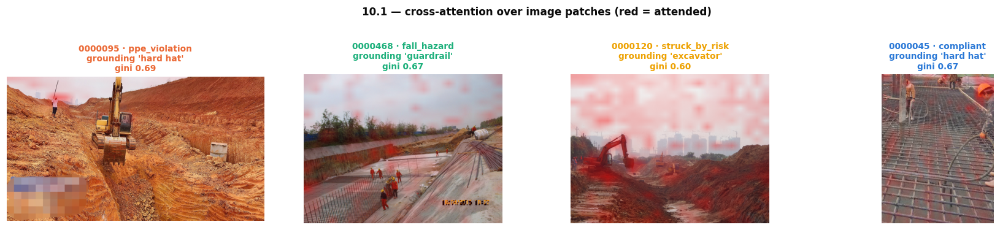

0000095  class=ppe_violation  tested against rule_1
  grounded phrase : 'hard hat'
  detections      : 1 worker(s), 1 object(s)
  graded score    : 1.0
  model verdict   : compliant   (expected violation)
  ground truth    : [rule_1] The worker is not wearing long pants.
  ground truth    : [rule_3] Either side of the excavation trench is protected.
  attention focus : gini 0.695, 2 of 576 cells above 0.5
0000468  class=fall_hazard  tested against rule_3
  grounded phrase : 'guardrail'
  detections      : 1 worker(s), 1 object(s)
  graded score    : 1.0
  model verdict   : compliant   (expected violation)
  ground truth    : [rule_3] The edge of excavation on the right is not guarded.
  attention focus : gini 0.670, 3 of 576 cells above 0.5
0000120  class=struck_by_risk  tested against rule_4
  grounded phrase : 'excavator'
  detections      : 1 worker(s), 1 object(s)
  graded score    : 0.0
  model verdict   : hazard   (expected hazard)
  ground truth    : [rule_4] The two workers on 

In [31]:
picks = [samples[0], samples[4], samples[8], samples[12]]  # one per class
overlays = [overlay_heatmap(IMAGES[s.image_id], ATTR[s.image_id].heatmap, alpha=0.55, gamma=0.5)
            for s in picks]
show_images(overlays,
            [f"{s.image_id} · {s.primary_class}\ngrounding '{attribution_phrase(s.assigned_rule_id)}'"
             f"\ngini {sparsity.gini_concentration(ATTR[s.image_id].heatmap):.2f}" for s in picks],
            figsize_each=(4.0, 3.3), title_colors=[CLASS_COLORS[s.primary_class] for s in picks],
            suptitle="10.1 — cross-attention over image patches (red = attended)")

for s in picks:
    r = BASE[s.image_id]
    print("=" * 78)
    print(f"{s.image_id}  class={s.primary_class}  tested against {s.assigned_rule_id}")
    print(f"  grounded phrase : '{attribution_phrase(s.assigned_rule_id)}'")
    print(f"  detections      : {len(r.worker_boxes)} worker(s), {len(r.object_boxes)} object(s)")
    print(f"  graded score    : {r.graded_score}")
    print(f"  model verdict   : {r.answer}   (expected {expected_answer(s)})")
    if GT[s.image_id]:
        for rule, (_, reason) in GT[s.image_id].items():
            print(f"  ground truth    : [{rule}] {reason}")
    else:
        print("  ground truth    : compliant -- no violation recorded")
    print(f"  attention focus : gini {sparsity.gini_concentration(ATTR[s.image_id].heatmap):.3f}, "
          f"{sp_df.loc[sp_df.image_id == s.image_id, 'cells_above_0.5'].iloc[0]} of 576 cells above 0.5")

**How the conclusion was reached, in words.** For each image above the chain is identical:
ground `"worker"` → ground the rule's object → measure edge-to-edge distance → *compliant*
only if every worker has an object within threshold. The heatmap shows where attention fell
during the grounding call, so a diffuse map next to a confident verdict means the verdict
rests on a box the model was not strongly focused on producing. Note this is a
*correlational* reading: the heatmap explains a greedy re-decode, not the beam decode that
produced the verdict (see the decoding note above).

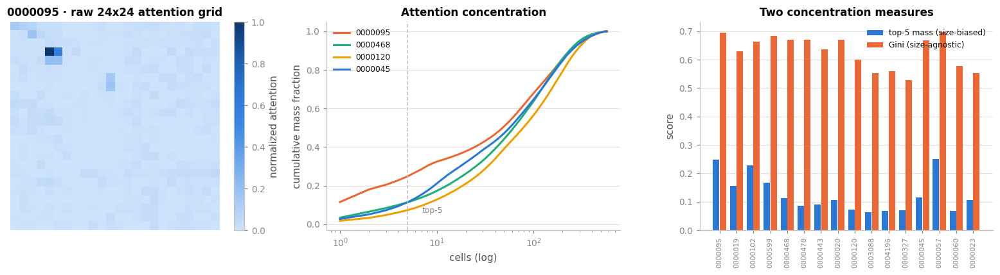

subset mean top-5 mass: 0.126   frozen 163-sample: 0.108
subset mean Gini      : 0.628
INTERPRETATION: uniform attention would give a top-5 mass of 5/576 = 0.009; all mass
in 5 cells would give 1.0. The measured values sit well above uniform but far from
peaked -- attention is real but diffuse, which is why the size-agnostic Gini was
adopted for the scale run.


In [32]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

ax = axes[0]
hm = ATTR[picks[0].image_id].heatmap
im_ = ax.imshow(hm, cmap=SEQ)
ax.set_title(f"{picks[0].image_id} · raw {hm.shape[0]}x{hm.shape[1]} attention grid")
ax.set_xticks([]); ax.set_yticks([])
fig.colorbar(im_, ax=ax, fraction=0.046, label="normalized attention")
for s_ in ax.spines.values():
    s_.set_visible(False)

ax = style_ax(axes[1])
for s in picks:
    flat = np.sort(ATTR[s.image_id].heatmap.flatten())[::-1]
    ax.plot(np.arange(1, len(flat) + 1), np.cumsum(flat) / flat.sum(), linewidth=2,
            label=s.image_id, color=CLASS_COLORS[s.primary_class])
ax.axvline(5, color=BASELINE, linestyle="--", linewidth=1)
ax.text(7, 0.06, "top-5", fontsize=FS_SMALL, color=MUTED)
ax.set_xscale("log"); ax.set_xlabel("cells (log)"); ax.set_ylabel("cumulative mass fraction")
ax.set_title("Attention concentration"); ax.legend(frameon=False, fontsize=FS_SMALL)

ax = style_ax(axes[2])
x = np.arange(len(sp_df))
ax.bar(x - 0.2, sp_df["top5_mass"], width=0.38, color=ACCENT, label="top-5 mass (size-biased)")
ax.bar(x + 0.2, sp_df["gini"], width=0.38, color=ACCENT_2, label="Gini (size-agnostic)")
ax.set_xticks(x); ax.set_xticklabels(sp_df["image_id"], rotation=90, fontsize=FS_DENSE)
ax.set_ylabel("score"); ax.set_title("Two concentration measures")
ax.legend(frameon=False, fontsize=FS_SMALL)
fig.tight_layout(); plt.show()

FROZEN_SP = float(frozen_summary.loc[frozen_summary["metric"] == "visual_sparsity_top5", "overall"].iloc[0])
print(f"subset mean top-5 mass: {sp_df['top5_mass'].mean():.3f}   frozen 163-sample: {FROZEN_SP:.3f}")
print(f"subset mean Gini      : {sp_df['gini'].mean():.3f}")
print("INTERPRETATION: uniform attention would give a top-5 mass of 5/576 = 0.009; all mass")
print("in 5 cells would give 1.0. The measured values sit well above uniform but far from")
print("peaked -- attention is real but diffuse, which is why the size-agnostic Gini was")
print("adopted for the scale run.")

## 11. Metric 3 — Stability

> *Do repeated runs on the same input agree with each other?*

**In:** each image and rule, rerun `n=3` times with **sampling** decoding.
**Out:** pairwise answer agreement, object-presence rate, and centroid drift.

Florence-2's default beam decoding is deterministic, so three literal reruns would be
bit-identical and "100% stable" by construction — proving nothing. The real test reruns
with `do_sample=True, num_beams=1, temperature=0.7` so the runs *can* disagree.

In [33]:
from xai_pilot.metrics import stability

N_RERUNS, TEMPERATURE = 3, 0.7
stage("11 stability reruns",
      f"image + rule, n={N_RERUNS} sampled decodes at temperature={TEMPERATURE}",
      "agreement rate, object-presence rate, normalized centroid drift")

STAB = {s.image_id: stability.run_n_times(model, processor, IMAGES[s.image_id],
                                          s.assigned_rule_id, n=N_RERUNS, temperature=TEMPERATURE)
        for s in samples}

st_df = pd.DataFrame([{
    "image_id": s.image_id, "class": s.primary_class,
    "deterministic": BASE[s.image_id].answer,
    "reruns": "|".join(r.answer for r in STAB[s.image_id]),
    "agreement": stability.answer_agreement_rate(STAB[s.image_id]),
    "object_presence": stability.object_presence_rate(STAB[s.image_id]),
    "centroid_drift": stability.mean_pairwise_centroid_distance(
        [r.object_boxes[0] for r in STAB[s.image_id] if r.object_boxes], IMAGES[s.image_id].size),
} for s in samples])
print(st_df.to_string(index=False, float_format=lambda v: f"{v:.3f}"))
print(f"\nmean pairwise answer agreement: {st_df['agreement'].mean():.1%}")
below_floor_banner(len(st_df), "stability")

+------------------------------------------------------------------------------
| STAGE : 11 stability reruns
| IN    : image + rule, n=3 sampled decodes at temperature=0.7
| OUT   : agreement rate, object-presence rate, normalized centroid drift
+------------------------------------------------------------------------------


image_id          class deterministic                        reruns  agreement  object_presence  centroid_drift
 0000095  ppe_violation     compliant compliant|compliant|violation      0.333            1.000           0.003
 0000019  ppe_violation     violation compliant|violation|violation      0.333            1.000           0.217
 0000102  ppe_violation     compliant compliant|compliant|compliant      1.000            1.000           0.001
 0000599  ppe_violation     compliant violation|violation|violation      1.000            1.000           0.190
 0000468    fall_hazard     compliant compliant|compliant|compliant      1.000            1.000           0.145
 0000478    fall_hazard     compliant compliant|compliant|compliant      1.000            1.000           0.057
 0000443    fall_hazard     compliant compliant|compliant|compliant      1.000            1.000           0.031
 0000020    fall_hazard     compliant compliant|compliant|compliant      1.000            1.000         

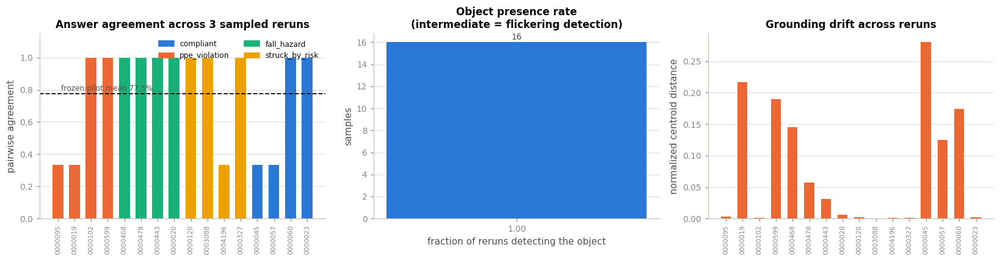

subset agreement 79.2%   frozen 163-sample: 77.5%
samples with a flickering object detection: 0/16
INTERPRETATION: the pilot's original overlap score returned NaN for exactly these
samples and silently dropped them -- the worst kind of instability to hide. Phase 2.3
turned that silence into the presence-rate number above.


In [34]:
FROZEN_ST = float(frozen_summary.loc[frozen_summary["metric"] == "stability_answer_agreement", "overall"].iloc[0])
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

ax = style_ax(axes[0])
ax.bar(range(len(st_df)), st_df["agreement"], color=[CLASS_COLORS[c] for c in st_df["class"]], width=0.65)
ax.axhline(FROZEN_ST, color=INK, linestyle="--", linewidth=1.2)
ax.text(0.2, FROZEN_ST + 0.02, f"frozen pilot mean {FROZEN_ST:.1%}", fontsize=FS_SMALL, color=SECONDARY)
ax.set_xticks(range(len(st_df))); ax.set_xticklabels(st_df["image_id"], rotation=90, fontsize=FS_DENSE)
ax.set_ylim(0, 1.15); ax.set_ylabel("pairwise agreement")
ax.set_title(f"Answer agreement across {N_RERUNS} sampled reruns")
ax.legend([plt.Rectangle((0, 0), 1, 1, color=CLASS_COLORS[c]) for c in CLASS_ORDER],
          CLASS_ORDER, frameon=False, fontsize=FS_SMALL, ncol=2)

ax = style_ax(axes[1])
pres = st_df["object_presence"].value_counts().sort_index()
bars = ax.bar(range(len(pres)), pres.values, color=ACCENT, width=0.5)
label_bars(ax, bars, fmt="{:.0f}", dy=0.1)
ax.set_xticks(range(len(pres))); ax.set_xticklabels([f"{v:.2f}" for v in pres.index], fontsize=FS_BODY)
ax.set_xlabel("fraction of reruns detecting the object"); ax.set_ylabel("samples")
ax.set_title("Object presence rate\n(intermediate = flickering detection)")

ax = style_ax(axes[2])
dr = st_df["centroid_drift"].values
ok = ~np.isnan(dr)
ax.bar(np.arange(len(dr))[ok], dr[ok], color=ACCENT_2, width=0.6)
ax.set_xticks(range(len(dr))); ax.set_xticklabels(st_df["image_id"], rotation=90, fontsize=FS_DENSE)
ax.set_ylabel("normalized centroid distance"); ax.set_title("Grounding drift across reruns")
fig.tight_layout(); plt.show()

flicker = ((st_df["object_presence"] > 0) & (st_df["object_presence"] < 1)).sum()
print(f"subset agreement {st_df['agreement'].mean():.1%}   frozen 163-sample: {FROZEN_ST:.1%}")
print(f"samples with a flickering object detection: {flicker}/{len(st_df)}")
print("INTERPRETATION: the pilot's original overlap score returned NaN for exactly these")
print("samples and silently dropped them -- the worst kind of instability to hide. Phase 2.3")
print("turned that silence into the presence-rate number above.")

## 12. Metric 4 — Efficiency

> *What does one evaluation cost, and does the full study fit a compute budget?*

**In:** repeated timed baseline calls.
**Out:** per-sample GPU-busy vs wall-clock time, and a linear extrapolation to scale.

`time_call_cuda` separates GPU-busy time (between two CUDA events, with explicit
synchronization so async kernel launches are accounted) from wall-clock. Their ratio is
GPU-bound-ness. Warm-up iterations are discarded — cold caches are not steady state.

In [35]:
from xai_pilot.metrics import efficiency

WARMUP = 2
stage("12 timing", "16 baseline answer_rule calls, first 2 discarded as warm-up",
      "mean/median/p90 wall time, GPU-bound fraction, extrapolation")

timings = []
for s in samples:
    _, gpu_ms, wall_ms = efficiency.time_call_cuda(
        lambda: answer_rule(model, processor, IMAGES[s.image_id], s.assigned_rule_id))
    timings.append({"image_id": s.image_id, "gpu_ms": gpu_ms, "wall_ms": wall_ms})

t_df = pd.DataFrame(timings)
t_df["gpu_bound"] = t_df["gpu_ms"] / t_df["wall_ms"]
summary = efficiency.summarize_timings(t_df["wall_ms"].tolist(), warmup=WARMUP)
print(f"per-sample wall time (after {WARMUP} warm-up samples discarded):")
for k, v in summary.items():
    print(f"  {k:<12}{v:.1f}" if isinstance(v, float) else f"  {k:<12}{v}")
print(f"\nmean GPU-bound fraction: {t_df['gpu_bound'].iloc[WARMUP:].mean():.1%}")
ext = efficiency.extrapolate(summary["mean_ms"], 1000)
print(f"linear extrapolation of THIS stage to n=1000: {ext['total_minutes']:.1f} min")

+------------------------------------------------------------------------------
| STAGE : 12 timing
| IN    : 16 baseline answer_rule calls, first 2 discarded as warm-up
| OUT   : mean/median/p90 wall time, GPU-bound fraction, extrapolation
+------------------------------------------------------------------------------


per-sample wall time (after 2 warm-up samples discarded):
  n           14
  mean_ms     243.9
  median_ms   237.0
  p90_ms      266.9
  std_ms      19.7
  max_ms      293.3

mean GPU-bound fraction: 100.0%
linear extrapolation of THIS stage to n=1000: 4.1 min


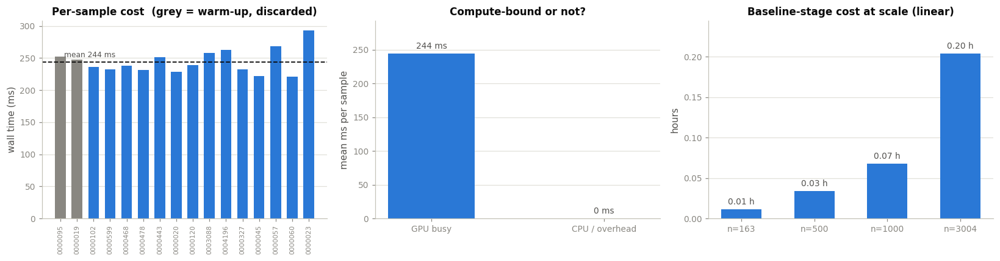

INTERPRETATION: frozen pilot's FULL-pipeline budget at n=1000 is 0.50 h.
The bars above time only the baseline answer call, so they are a component of that
budget, not a competing estimate.


In [36]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

ax = style_ax(axes[0])
cols = [MUTED] * WARMUP + [ACCENT] * (len(t_df) - WARMUP)
ax.bar(range(len(t_df)), t_df["wall_ms"], color=cols, width=0.65)
ax.axhline(summary["mean_ms"], color=INK, linestyle="--", linewidth=1.2)
ax.text(0.2, summary["mean_ms"] * 1.03, f"mean {summary['mean_ms']:.0f} ms", fontsize=FS_SMALL, color=SECONDARY)
ax.set_xticks(range(len(t_df))); ax.set_xticklabels(t_df["image_id"], rotation=90, fontsize=FS_DENSE)
ax.set_ylabel("wall time (ms)"); ax.set_title("Per-sample cost  (grey = warm-up, discarded)")

ax = style_ax(axes[1])
m = t_df.iloc[WARMUP:]
vals = [m["gpu_ms"].mean(), (m["wall_ms"] - m["gpu_ms"]).mean()]
bars = ax.bar([0, 1], vals, color=[ACCENT, MUTED], width=0.5)
label_bars(ax, bars, fmt="{:.0f} ms", dy=max(vals) * 0.02)
ax.set_xticks([0, 1]); ax.set_xticklabels(["GPU busy", "CPU / overhead"], fontsize=FS_BODY)
ax.set_ylabel("mean ms per sample"); ax.set_title("Compute-bound or not?"); ax.set_ylim(0, max(vals) * 1.2)

ax = style_ax(axes[2])
ns = [163, 500, 1000, 3004]
hrs = [efficiency.extrapolate(summary["mean_ms"], n)["total_hours"] for n in ns]
bars = ax.bar(range(len(ns)), hrs, color=ACCENT, width=0.55)
label_bars(ax, bars, fmt="{:.2f} h", dy=max(hrs) * 0.02)
ax.set_xticks(range(len(ns))); ax.set_xticklabels([f"n={n}" for n in ns], fontsize=FS_BODY)
ax.set_ylabel("hours"); ax.set_title("Baseline-stage cost at scale (linear)"); ax.set_ylim(0, max(hrs) * 1.2)
fig.tight_layout(); plt.show()

FROZEN_EF = float(frozen_summary.loc[
    frozen_summary["metric"] == "efficiency_total_pipeline_1000hr", "overall"].iloc[0])
print(f"INTERPRETATION: frozen pilot's FULL-pipeline budget at n=1000 is {FROZEN_EF:.2f} h.")
print("The bars above time only the baseline answer call, so they are a component of that")
print("budget, not a competing estimate.")

## 13. Metric 5 — Robustness

> *Do answers and explanations survive realistic image degradation?*

**In:** each image under four perturbations, re-answered.
**Out:** answer survival, box IoU, size-invariant centroid drift, disappearance and
worker-loss flags.

A perturbation that makes the worker undetectable flips the answer through the fallback
branch rather than through any change in safety reasoning — so that case is flagged
separately rather than folded into a generic "answer changed" rate.

In [37]:
from xai_pilot.metrics import robustness
from xai_pilot import perturbations as pert

PERTURBATIONS = {
    "blur":      lambda im: pert.blur(im, ksize=8.0),
    "low_light": lambda im: pert.low_light(im, gamma=2.5),
    "occlude":   lambda im: pert.occlude(im, frac=0.2, location="center"),
    "contrast":  lambda im: pert.contrast_shift(im, factor=0.3),
}
stage("13 robustness", "16 images x 4 perturbations, re-answered against the baseline",
      "survival flag, IoU, centroid drift, disappearance + worker-loss flags")

rob_rows = []
for s in samples:
    for name, fn in PERTURBATIONS.items():
        r = robustness.evaluate(model, processor, fn(IMAGES[s.image_id]),
                                s.assigned_rule_id, BASE[s.image_id])
        rob_rows.append({"image_id": s.image_id, "class": s.primary_class, "perturbation": name,
                         "survived": not r.answer_changed, "iou": r.object_box_iou,
                         "centroid_drift": r.object_centroid_drift,
                         "object_disappeared": r.object_disappeared,
                         "worker_lost": r.worker_lost, "contaminated": r.flip_due_to_worker_loss})
rob_df = pd.DataFrame(rob_rows)
print(rob_df.groupby("perturbation").agg(
    survival=("survived", "mean"), mean_iou=("iou", "mean"),
    disappeared=("object_disappeared", "mean"), worker_lost=("worker_lost", "mean"),
).to_string(float_format=lambda v: f"{v:.3f}"))
print(f"\noverall answer survival: {rob_df['survived'].mean():.1%}")
below_floor_banner(len(rob_df), "robustness (sample x perturbation pairs)")

+------------------------------------------------------------------------------
| STAGE : 13 robustness
| IN    : 16 images x 4 perturbations, re-answered against the baseline
| OUT   : survival flag, IoU, centroid drift, disappearance + worker-loss flags
+------------------------------------------------------------------------------


              survival  mean_iou  disappeared  worker_lost
perturbation                                              
blur             0.750     0.391        0.000        0.000
contrast         0.812     0.902        0.000        0.000
low_light        0.812     0.720        0.000        0.062
occlude          0.750     0.593        0.062        0.000

overall answer survival: 78.1%
[OK] robustness (sample x perturbation pairs): n=64 vs MIN_N_FLOOR=30 -> reportable


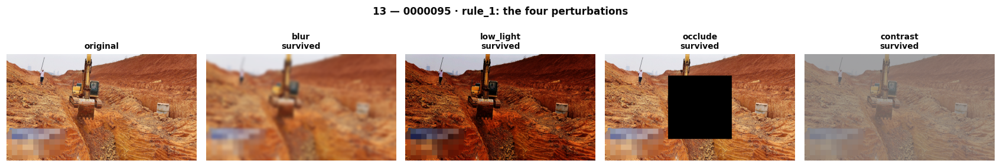

In [38]:
demo2 = samples[0]
im0 = IMAGES[demo2.image_id]
show_images([im0] + [fn(im0) for fn in PERTURBATIONS.values()],
            ["original"] + [
                f"{n}\n{'survived' if rob_df[(rob_df.image_id == demo2.image_id) & (rob_df.perturbation == n)]['survived'].iloc[0] else 'FLIPPED'}"
                for n in PERTURBATIONS],
            figsize_each=(3.1, 2.7),
            suptitle=f"13 — {demo2.image_id} · {demo2.assigned_rule_id}: the four perturbations")

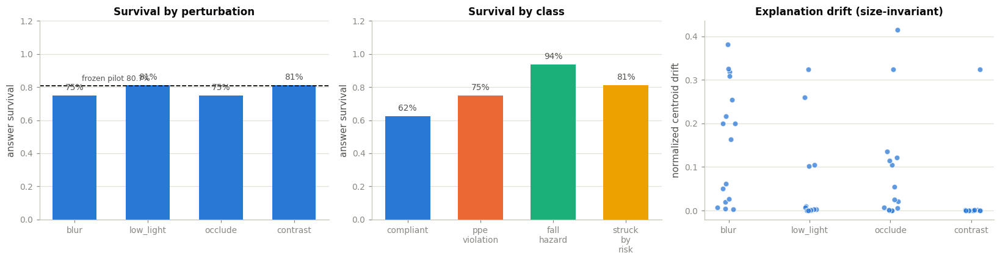

answer flips attributable to worker loss: 1/64 pairs
object detection disappeared entirely in 1.6% of pairs
INTERPRETATION: an answer that 'survives' while its explanation box moves across the
image is not really robust -- which is why drift is reported beside survival.


In [39]:
FROZEN_RB = float(frozen_summary.loc[
    frozen_summary["metric"] == "robustness_level1_answer_survival", "overall"].iloc[0])
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

ax = style_ax(axes[0])
sv = rob_df.groupby("perturbation")["survived"].mean().reindex(list(PERTURBATIONS))
bars = ax.bar(range(len(sv)), sv.values, color=ACCENT, width=0.6)
label_bars(ax, bars, fmt="{:.0%}", dy=0.02)
ax.axhline(FROZEN_RB, color=INK, linestyle="--", linewidth=1.2)
ax.text(0.1, FROZEN_RB + 0.03, f"frozen pilot {FROZEN_RB:.1%}", fontsize=FS_SMALL, color=SECONDARY)
ax.set_xticks(range(len(sv))); ax.set_xticklabels(sv.index, fontsize=FS_BODY)
ax.set_ylim(0, 1.2); ax.set_ylabel("answer survival"); ax.set_title("Survival by perturbation")

ax = style_ax(axes[1])
sc = rob_df.groupby("class")["survived"].mean().reindex(CLASS_ORDER)
bars = ax.bar(range(4), sc.values, color=[CLASS_COLORS[c] for c in CLASS_ORDER], width=0.62)
label_bars(ax, bars, fmt="{:.0%}", dy=0.02)
ax.set_xticks(range(4)); ax.set_xticklabels([c.replace("_", "\n") for c in CLASS_ORDER], fontsize=FS_BODY)
ax.set_ylim(0, 1.2); ax.set_ylabel("answer survival"); ax.set_title("Survival by class")

ax = style_ax(axes[2])
rng = np.random.default_rng(0)
for i, p in enumerate(PERTURBATIONS):
    sub = rob_df[rob_df["perturbation"] == p]["centroid_drift"].dropna()
    if len(sub):
        ax.scatter(np.full(len(sub), i) + rng.normal(0, 0.06, len(sub)), sub,
                   s=34, color=ACCENT, alpha=0.75, edgecolor="white", linewidth=0.8)
ax.set_xticks(range(len(PERTURBATIONS))); ax.set_xticklabels(list(PERTURBATIONS), fontsize=FS_BODY)
ax.set_ylabel("normalized centroid drift"); ax.set_title("Explanation drift (size-invariant)")
fig.tight_layout(); plt.show()

print(f"answer flips attributable to worker loss: {rob_df['contaminated'].sum()}/{len(rob_df)} pairs")
print(f"object detection disappeared entirely in {rob_df['object_disappeared'].mean():.1%} of pairs")
print("INTERPRETATION: an answer that 'survives' while its explanation box moves across the")
print("image is not really robust -- which is why drift is reported beside survival.")

## 14. Metric 6 — Bounded Completeness

> *Did the model provide a usable explanation, and was it load-bearing?*

**In:** the region source from §8 and the flip flags from §9 — no new model calls.
**Out:** one of three verdicts per sample, raw and worker-loss-corrected.

- **`no_usable_explanation`** — no grounding box existed at all (grid fallback), so there
  is no model-pointed region to test.
- **`explanation_supported`** — a real region existed and masking it changed the answer.
- **`explanation_weak`** — a real region existed but masking it changed nothing.

In [40]:
from xai_pilot.metrics import completeness

stage("14 bounded completeness", "top region source + flip flags (from §8 and §9)",
      "verdict per sample, raw and worker-loss-corrected")

comp_df = pd.DataFrame([{
    "image_id": s.image_id, "class": s.primary_class,
    "top_source": REGIONS[s.image_id][0].source,
    "verdict_raw": completeness.classify_sample(
        REGIONS[s.image_id][0].source, DA[s.image_id].answer_changed_top1,
        DA[s.image_id].answer_changed_top2),
    "verdict_corrected": completeness.classify_sample_worker_loss_corrected(
        REGIONS[s.image_id][0].source, DA[s.image_id].answer_changed_top1,
        DA[s.image_id].answer_changed_top2, DA[s.image_id].flip_due_to_worker_loss_top1,
        DA[s.image_id].flip_due_to_worker_loss_top2),
} for s in samples])
print(comp_df.to_string(index=False))

supported_raw = (comp_df["verdict_raw"] == "explanation_supported").mean()
supported_cor = (comp_df["verdict_corrected"] == "explanation_supported").mean()
downgraded = ((comp_df["verdict_raw"] == "explanation_supported") &
              (comp_df["verdict_corrected"] != "explanation_supported")).sum()
print(f"\nexplanation_supported  raw: {supported_raw:.1%}   corrected: {supported_cor:.1%}")
print(f"verdicts downgraded by the worker-loss correction: {downgraded}")
below_floor_banner(len(comp_df), "bounded completeness")

+------------------------------------------------------------------------------
| STAGE : 14 bounded completeness
| IN    : top region source + flip flags (from §8 and §9)
| OUT   : verdict per sample, raw and worker-loss-corrected
+------------------------------------------------------------------------------
image_id          class top_source           verdict_raw     verdict_corrected
 0000095  ppe_violation      model      explanation_weak      explanation_weak
 0000019  ppe_violation      model explanation_supported explanation_supported
 0000102  ppe_violation      model      explanation_weak      explanation_weak
 0000599  ppe_violation      model      explanation_weak      explanation_weak
 0000468    fall_hazard      model      explanation_weak      explanation_weak
 0000478    fall_hazard      model explanation_supported explanation_supported
 0000443    fall_hazard      model      explanation_weak      explanation_weak
 0000020    fall_hazard      model      explanation_weak

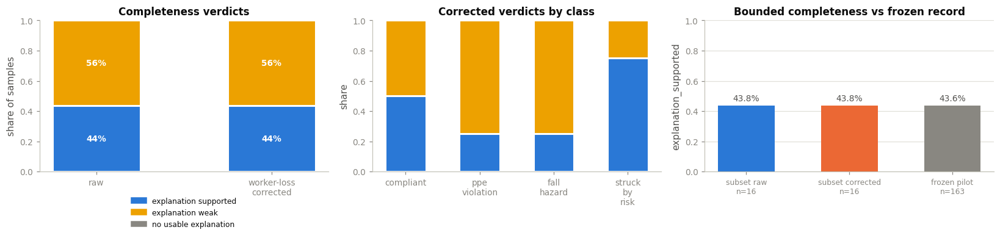

In [41]:
VERDICTS = ["explanation_supported", "explanation_weak", "no_usable_explanation"]
VCOLORS = {"explanation_supported": "#2a78d6", "explanation_weak": "#eda100",
           "no_usable_explanation": "#898781"}
FROZEN_BC = float(frozen_summary.loc[frozen_summary["metric"] == "bounded_completeness", "overall"].iloc[0])

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

ax = style_ax(axes[0], ygrid=False)
for i, col in enumerate(["verdict_raw", "verdict_corrected"]):
    bottom = 0.0
    for v in VERDICTS:
        h = (comp_df[col] == v).mean()
        if h > 0:
            ax.bar(i, h, bottom=bottom, color=VCOLORS[v], width=0.5, edgecolor="white", linewidth=2)
            ax.text(i, bottom + h / 2, f"{h:.0%}", ha="center", va="center",
                    fontsize=FS_BODY, color="white", fontweight="bold")
        bottom += h
ax.set_xticks([0, 1]); ax.set_xticklabels(["raw", "worker-loss\ncorrected"], fontsize=FS_BODY)
ax.set_ylim(0, 1); ax.set_ylabel("share of samples"); ax.set_title("Completeness verdicts")
ax.legend([plt.Rectangle((0, 0), 1, 1, color=VCOLORS[v]) for v in VERDICTS],
          [v.replace("_", " ") for v in VERDICTS], frameon=False, fontsize=FS_SMALL,
          loc="lower center", bbox_to_anchor=(0.5, -0.42))

ax = style_ax(axes[1], ygrid=False)
for i, c in enumerate(CLASS_ORDER):
    sub = comp_df[comp_df["class"] == c]
    bottom = 0.0
    for v in VERDICTS:
        h = (sub["verdict_corrected"] == v).mean() if len(sub) else 0.0
        if h > 0:
            ax.bar(i, h, bottom=bottom, color=VCOLORS[v], width=0.55, edgecolor="white", linewidth=2)
        bottom += h
ax.set_xticks(range(4)); ax.set_xticklabels([c.replace("_", "\n") for c in CLASS_ORDER], fontsize=FS_BODY)
ax.set_ylim(0, 1); ax.set_ylabel("share"); ax.set_title("Corrected verdicts by class")

ax = style_ax(axes[2])
bars = ax.bar([0, 1, 2], [supported_raw, supported_cor, FROZEN_BC],
              color=[ACCENT, ACCENT_2, MUTED], width=0.55)
label_bars(ax, bars, fmt="{:.1%}", dy=0.02)
ax.set_xticks([0, 1, 2])
ax.set_xticklabels([f"subset raw\nn={len(comp_df)}", f"subset corrected\nn={len(comp_df)}",
                    "frozen pilot\nn=163"], fontsize=FS_SMALL)
ax.set_ylim(0, 1.0); ax.set_ylabel("explanation_supported")
ax.set_title("Bounded completeness vs frozen record")
fig.tight_layout(); plt.show()

## 15. Roll-up — subset beside the frozen record

**In:** every metric computed above.
**Out:** one table and one chart placing the live subset next to the authoritative
163-sample record, with bootstrap confidence intervals and a reportability flag.

In [42]:
from xai_pilot.stats import bootstrap_ci, MIN_N_FLOOR

rollup = []
def add(metric, values, frozen_key):
    ci = bootstrap_ci(np.asarray(values, dtype=float), n_boot=5000, seed=0)
    row = frozen_summary.loc[frozen_summary["metric"] == frozen_key]
    rollup.append({"metric": metric, "subset": ci["point"], "lo": ci["lo"], "hi": ci["hi"],
                   "n": ci["n"], "frozen": float(row["overall"].iloc[0]),
                   "frozen_n": row["n"].iloc[0]})

add("descriptive_accuracy", (da_df["flip_top1"] | da_df["flip_top2"]).astype(float), "descriptive_accuracy")
add("visual_sparsity_top5", sp_df["top5_mass"], "visual_sparsity_top5")
add("stability_agreement", st_df["agreement"], "stability_answer_agreement")
add("robustness_survival", rob_df["survived"].astype(float), "robustness_level1_answer_survival")
add("bounded_completeness", (comp_df["verdict_raw"] == "explanation_supported").astype(float), "bounded_completeness")

roll_df = pd.DataFrame(rollup)
roll_df["reportable"] = roll_df["n"] >= MIN_N_FLOOR
print(roll_df.to_string(index=False, float_format=lambda v: f"{v:.3f}"))

              metric  subset    lo    hi  n  frozen frozen_n  reportable
descriptive_accuracy   0.438 0.188 0.688 16   0.362      163       False
visual_sparsity_top5   0.126 0.097 0.159 16   0.108      159       False
 stability_agreement   0.792 0.625 0.917 16   0.775      163       False
 robustness_survival   0.781 0.688 0.875 64   0.807      652        True
bounded_completeness   0.438 0.188 0.688 16   0.436      163       False


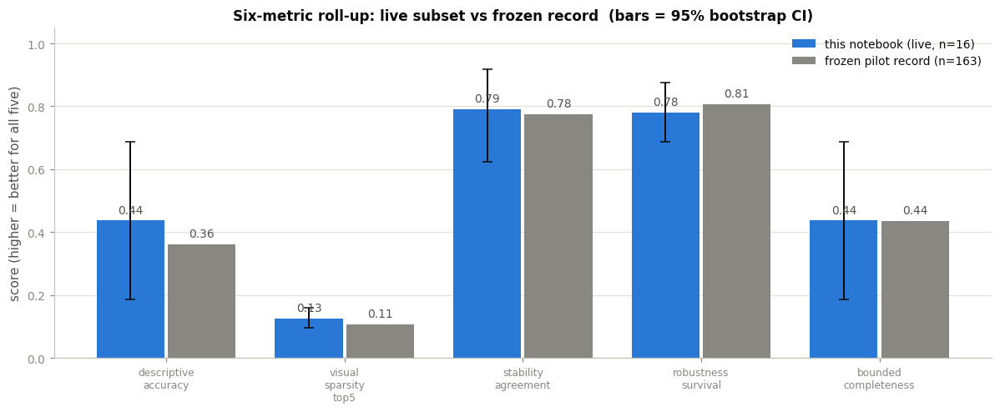

Efficiency is excluded from this chart: it is a runtime budget in hours, not a
per-sample rate on a 0-1 scale, so plotting it on the same axis would mislead.

INTERPRETATION: wide confidence intervals are the honest consequence of n=16.
They are the reason the frozen numbers, not these, are the ones that get quoted.


In [43]:
fig, ax = plt.subplots(figsize=(11, 4.6))
style_ax(ax)
x = np.arange(len(roll_df))
b1 = ax.bar(x - 0.2, roll_df["subset"], width=0.38, color=ACCENT, label="this notebook (live, n=16)")
b2 = ax.bar(x + 0.2, roll_df["frozen"], width=0.38, color=MUTED, label="frozen pilot record (n=163)")
ax.errorbar(x - 0.2, roll_df["subset"],
            yerr=[roll_df["subset"] - roll_df["lo"], roll_df["hi"] - roll_df["subset"]],
            fmt="none", ecolor=INK, capsize=4, linewidth=1.3)
label_bars(ax, b1, fmt="{:.2f}", dy=0.015)
label_bars(ax, b2, fmt="{:.2f}", dy=0.015)
ax.set_xticks(x); ax.set_xticklabels([m.replace("_", "\n") for m in roll_df["metric"]], fontsize=FS_SMALL)
ax.set_ylabel("score (higher = better for all five)")
ax.set_title("Six-metric roll-up: live subset vs frozen record  (bars = 95% bootstrap CI)")
ax.legend(frameon=False, fontsize=FS_BODY); ax.set_ylim(0, 1.05)
fig.tight_layout(); plt.show()

print("Efficiency is excluded from this chart: it is a runtime budget in hours, not a")
print("per-sample rate on a 0-1 scale, so plotting it on the same axis would mislead.")
print(f"\nINTERPRETATION: wide confidence intervals are the honest consequence of n=16.")
print("They are the reason the frozen numbers, not these, are the ones that get quoted.")

## 16. What these numbers do and don't mean

### The central caveat

Every metric above measures **the hand-written geometric proxy**, not Florence-2's
internal reasoning. Section 5.3 showed this concretely: the pipeline never checks that a
detected box is really a hard hat, and never checks that a worker is *wearing* anything —
only that two boxes are within a distance threshold. When descriptive accuracy reports
that masking a region flipped the answer, that can mean the model's understanding changed,
or merely that a box moved across a threshold.

Separating those two is the central goal of the scale-up.

### Specific biases visible in this notebook

| # | Issue | Where | Fix |
|---|---|---|---|
| 1 | **No label verification** — `bboxes_labels` is discarded, so any box returned for the phrase is accepted as the object | §5.3, §6.2 | validate returned labels; add a per-box confidence gate |
| 2 | **Co-location ≠ wearing** — a hat on the ground within threshold marks a worker compliant, and one hat can cover many workers | §5.3 | require containment in the worker's upper region; one-to-one assignment |
| 3 | **Rule scope exceeds the grounded phrase** — `rule_1` covers PPE generally, but only `"hard hat"` is queried, so ~17% of its violations are undetectable by construction | §5.4 | ground every phrase in `RULE_QUERIES` and combine |
| 4 | **Area ranking favours the worker body** over the small PPE object the rule is about | §8 | `REGION_RANKING="rule_aware"` |
| 5 | **Worker-loss fallback** — masking or perturbing away the worker flips the answer through the scene-level branch | §9, §13, §14 | log post-op worker boxes; report raw *and* genuine rates |
| 6 | **Priority collapse** discards every hazard but the highest-priority one | §2.2, §3 | `LABELING="multilabel"` |
| 7 | **Top-k sparsity is size-biased** against physically large objects | §10 | Gini coefficient |
| 8 | **Decoding fragmentation** — attribution decodes greedily, answers use beam search | §10 | unify under `config.DECODING` |
| 9 | **Boolean flips discard magnitude** | §9 | continuous `graded_score` |
| 10 | **Silent NaN dropping** hid flickering object detections | §11 | explicit object-presence rate |
| 11 | **Blind round-robin rule assignment** can test compliant images against a vacuous rule | §3, §4 | `COMPLIANT_ASSIGNMENT="context_matched"` |

Items 1 and 2 are the deepest: they are limits of the *proxy design*, not tuning issues,
and no threshold choice fixes them. Every other fix is behind a default-off flag, so the
frozen pilot still reproduces byte-for-byte. This notebook ran with all of them **off** —
which is why the biases are visible rather than hidden.

### Reproducing at full scale

```bash
cd pilot
python scripts/01_check_environment.py
python scripts/02_select_samples.py
python scripts/03_run_baseline_inference.py
python scripts/04_extract_regions.py
python scripts/05_descriptive_accuracy.py
python scripts/06_visual_sparsity.py
python scripts/07_stability_test.py
python scripts/08_efficiency_test.py
python scripts/09_robustness_test.py
python scripts/10_bounded_completeness.py
python scripts/11_make_figures.py
python scripts/13_statistics_report.py
```

Each stage takes `--region-ranking`, and non-default modes write mode-suffixed CSVs so the
frozen `results/*.csv` are never overwritten.